# Notebook to analyse newly acquired spacers extracted from CRISPR arrays

### import dependencies

In [3]:
import sys,os, glob
import shutil
import json

import numpy as np

import matplotlib.pyplot as plt
plt.rcParams['pdf.fonttype'] = 42

import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'

import seaborn as sns
from pycirclize import Circos
from pycirclize.utils import fetch_genbank_by_accid
from pycirclize.parser import Genbank

import Bio
from Bio import SeqIO, SeqRecord, motifs
from Bio.Seq import Seq
from Bio.Blast.Applications import NcbiblastnCommandline
from Bio.Blast import NCBIWWW, NCBIXML

import gffpandas.gffpandas as gffpd

import fuzzysearch
import re
from collections import Counter, OrderedDict

from fuzzysearch import find_near_matches

import logomaker as lm

### make sure we have all the files needed for the notebook's analyses

In [4]:
import os.path
for fname in ['samples.xlsx', 'MG1655.gff', 'MG1655.fasta',
             'lambda.gff', 'lambda.fasta', 
             'pSCL565_.gff', 'pSCL565.fasta',
             'pSCL787.gff', 'pSCL787.fasta',
             'pSCL788.gff', 'pSCL788.fasta']:
    print(os.path.isfile(fname))

True
True
True
True
True
True
True
True
True
True
True


### set-up working notebook env

In [6]:
run = '~/miseq/msDMP02'
os.chdir(run)

In [7]:
samples = pd.read_excel("samples.xlsx")[["sample_name", "Description", "Sub-Library Owner", 'run']]
samples

,sample_name,Description,Sub-Library Owner,run
0,msDMP_02_109,BW25113_565_naive,SCL,A
1,msDMP_02_110,pcnB_565_naive,SCL,A
2,msDMP_02_111,sspA_565_naive,SCL,A
3,msDMP_02_112,uraA_565_naive,SCL,A
4,msDMP_02_113,osmF_565_naive,SCL,A
5,msDMP_02_114,polA-dKlenow_565_naive,SCL,A
6,msDMP_02_115,rclR_565_naive,SCL,A
7,msDMP_02_116,yeaO_565_naive,SCL,A
8,msDMP_02_117,mraZ_565_naive,SCL,A
9,msDMP_02_118,elaA_565_naive,SCL,A


### assuming you've run the `spacer_fishing` notebook, no need to run the following cells, go straight to loading spacers 

In [40]:
### fx to extract spacers recursively
def spacer_recurs(r):
    Repeat = 'GTGTTCCCCGCGCCAGCGGGGATAAACC'
    old_1 = 'GGCAAAAACCGGGCAATCGCAAAAAGGCGTAAT'
    old_2 = 'TGTGTTTGCGGCATTAACGCTCACCAGCATTTC'
    ''' 
    takes a sequence, extracts the left most spacer.
    this happens until it sees an old spacer. 
    returns a trimmed read and the new spacers, if any.
    '''    
    if len(find_near_matches(Repeat, r, max_l_dist=3))>=2: # there are at least two repeats
        matches = find_near_matches(Repeat, r, max_l_dist=3)
        _spacer = r[matches[0].end : matches[1].start]
        
        if ((len(find_near_matches(old_1, _spacer, max_l_dist=4))>0) or (len(find_near_matches(old_2, _spacer, max_l_dist=4))>0)):
            return (r, 'old', 'old')
        else:
            r = r[matches[1].start:]
            return (r, _spacer, 'new')
        

### cell to extract new spacers, save them into new_spacers_all, and quant adaptation rates

In [182]:
os.chdir(run)

barcode_44 = 'TATGGCTG'
barcode_69 = 'GACGACAG'
barcode_121 = 'TAAAGTCG'

fastq_reads = "trimmed_R1.fastq"
Repeat = 'GTGTTCCCCGCGCCAGCGGGGATAAACC'
old_1 = 'GGCAAAAACCGGGCAATCGCAAAAAGGCGTAAT'

new_spacers_all = {}
counts_all = {}

for file in glob.glob("ms*"):
    fn = file.split("-ds")[0]
    print (fn)
    
    condition = samples["Description"][samples["sample_name"]==fn].to_string(index=False)
    print (condition)
    
    all_reads_str = []
    counts_all[fn] = {"parental_R1": 0,
                        "expanded_R1": 0,
                     "parental_R2": 0,
                        "expanded_R2": 0,
                     "parental_R3": 0,
                        "expanded_R3": 0}        
    
    print (fn + " -- " + condition)
    os.chdir(file)

    filename = glob.glob("*.fastq.gz")

    for seq_record in SeqIO.parse(fastq_reads, "fastq"):
        all_reads_str.append(str(seq_record.seq))
    read_counter = Counter(all_reads_str)
    
    new_spacers_all[fn] = []
    
    for read in read_counter:
        
        in_1 = find_near_matches(barcode_44, read[:20], max_l_dist=1)
        in_2 = find_near_matches(barcode_69, read[:20], max_l_dist=1)
        in_3 = find_near_matches(barcode_121, read[:20], max_l_dist=1)
        
        if len(in_1)>0:
            rep = 'R1'
        if len(in_2)>0:
            rep = 'R2'
        if len(in_3)>0:
            rep = 'R3'
        
        L_match = find_near_matches('AATAATAGGTTATGTTTAGA', read, max_l_dist=3)
        rep_matches = find_near_matches(Repeat, read, max_l_dist=3)

        if len(L_match)>0 and len(rep_matches)>1:
            r = read[L_match[0].end:]
            
            # recursively extract spacers from read
            flag = 'new'
            found_new = False
            while (flag!='old' and len(find_near_matches(Repeat, r, max_l_dist=3))>1):
                r, spacer, flag = spacer_recurs(r)
                
                if flag !='old':
                    found_new = True
                    new_spacers_all[fn].extend([spacer]*read_counter[read])

            if found_new:
                counts_all[fn]['expanded_{0}'.format(rep)]+= read_counter[read]
            else: 
                counts_all[fn]['parental_{0}'.format(rep)]+= read_counter[read]  
        else:
            pass

    try:
        print ("adaptation rate rep1: ", 100.0*counts_all[fn]['expanded_R1']/(counts_all[fn]['expanded_R1']+counts_all[fn]['parental_R1']))
        print ("adaptation rate rep2: ", 100.0*counts_all[fn]['expanded_R2']/(counts_all[fn]['expanded_R2']+counts_all[fn]['parental_R2']))
        print ("adaptation rate rep3: ", 100.0*counts_all[fn]['expanded_R3']/(counts_all[fn]['expanded_R3']+counts_all[fn]['parental_R3']))
    except:
        print ('sample seq failed')
    os.chdir(run)

msMRM_12_335
BW25113_565_naive
msMRM_12_335 -- BW25113_565_naive
adaptation rate rep1:  8.901704028096951
adaptation rate rep2:  9.28942073493593
adaptation rate rep3:  8.076358296622614


### Calculate total number of arrays looked at, as a normalisation to make comparisons across samples more fair

In [62]:
os.chdir(run)

fastq_reads = "trimmed_R1.fastq"
Repeat = 'GTGTTCCCCGCGCCAGCGGGGATAAACC'
old_1 = 'GGCAAAAACCGGGCAATCGCAAAAAGGCGTAAT'

array_counts_all = {}
expanded_array_counts_all = {}

for file in list(samples['sample_name']):
    for file in glob.glob(file+'*'):
        if os.path.isdir(file):
            print (file)
            fn = file.split("-")[0]
            print (fn)
            condition = samples["Description"][samples["sample_name"]==fn].to_string(index=False)
            print (condition)            
            all_reads_str = []
            array_counts_all[fn] = 0
            expanded_array_counts_all[fn] = 0
            print (fn + " -- " + condition)
            os.chdir(file)
            filename = glob.glob("*.fastq.gz")
        
            for seq_record in SeqIO.parse(fastq_reads, "fastq"):
                all_reads_str.append(str(seq_record.seq))
            read_counter = Counter(all_reads_str)
            print (len(read_counter))
            for read in read_counter:
                
                L_match = find_near_matches('AATAATAGGTTATGTTTAGA', read, max_l_dist=3)
                rep_matches = find_near_matches(Repeat, read, max_l_dist=3)
        
                if len(L_match)>0 and len(rep_matches)>1:
                    r = read[L_match[0].end:]
                    # recursively extract spacers from read
                    flag = 'new'
                    found_new = False
                    while (flag!='old' and len(find_near_matches(Repeat, r, max_l_dist=3))>1):
                        r, spacer, flag = spacer_recurs(r)
                        
                        if flag !='old':
                            found_new = True
                    if found_new:
                        expanded_array_counts_all[fn] += read_counter[read]
                        array_counts_all[fn] += read_counter[read]
                    else: 
                        array_counts_all[fn] += read_counter[read]
                        pass
                else:
                    pass
            try:
                print ('{0} total arrays, of which {1} are expanded'.format(array_counts_all[fn], expanded_array_counts_all[fn]))
            except:
                print ('sample seq failed')
        os.chdir(run)

msDMP_02_109-409504286
msDMP_02_109
BW25113_565_naive
msDMP_02_109 -- BW25113_565_naive
141554
183750 total arrays, of which 14132 are expanded
msDMP_02_110-409504287
msDMP_02_110
pcnB_565_naive
msDMP_02_110 -- pcnB_565_naive
118341
164090 total arrays, of which 6559 are expanded
msDMP_02_111-409504288
msDMP_02_111
sspA_565_naive
msDMP_02_111 -- sspA_565_naive
107515
150917 total arrays, of which 2456 are expanded
msDMP_02_112-409504289
msDMP_02_112
uraA_565_naive
msDMP_02_112 -- uraA_565_naive
107264
133420 total arrays, of which 11904 are expanded
msDMP_02_113-409504290
msDMP_02_113
osmF_565_naive
msDMP_02_113 -- osmF_565_naive
113717
142983 total arrays, of which 18188 are expanded
msDMP_02_114-409504291
msDMP_02_114
polA-dKlenow_565_naive
msDMP_02_114 -- polA-dKlenow_565_naive
107418
153796 total arrays, of which 1360 are expanded
msDMP_02_115-409504292
msDMP_02_115
rclR_565_naive
msDMP_02_115 -- rclR_565_naive
86583
112254 total arrays, of which 7019 are expanded
msDMP_02_116-4095

In [64]:
print (array_counts_all)
print (expanded_array_counts_all)

{'msDMP_02_109': 183750, 'msDMP_02_110': 164090, 'msDMP_02_111': 150917, 'msDMP_02_112': 133420, 'msDMP_02_113': 142983, 'msDMP_02_114': 153796, 'msDMP_02_115': 112254, 'msDMP_02_116': 68853, 'msDMP_02_117': 110244, 'msDMP_02_118': 128833, 'msDMP_02_119': 154825, 'msDMP_02_123': 177943, 'msDMP_02_124': 141485, 'msDMP_02_125': 155193, 'msDMP_02_126': 137658, 'msDMP_02_127': 137188, 'msDMP_02_128': 173202, 'msDMP_02_129': 180550, 'msDMP_02_130': 108083, 'msDMP_02_131': 12094, 'msDMP_02_132': 200441}
{'msDMP_02_109': 14132, 'msDMP_02_110': 6559, 'msDMP_02_111': 2456, 'msDMP_02_112': 11904, 'msDMP_02_113': 18188, 'msDMP_02_114': 1360, 'msDMP_02_115': 7019, 'msDMP_02_116': 4830, 'msDMP_02_117': 10633, 'msDMP_02_118': 20409, 'msDMP_02_119': 31145, 'msDMP_02_123': 12336, 'msDMP_02_124': 1806, 'msDMP_02_125': 12592, 'msDMP_02_126': 2966, 'msDMP_02_127': 3368, 'msDMP_02_128': 14120, 'msDMP_02_129': 5616, 'msDMP_02_130': 13099, 'msDMP_02_131': 154, 'msDMP_02_132': 6451}


### check yeaO double acquisitions and see how often I have the insG in the first vs. second position, to see if I can infer whether the acquisitions happened independently of one another or it was a jackpot in the original strain

In [15]:
os.chdir(run)

fastq_reads = "trimmed_R1.fastq"
Repeat = 'GTGTTCCCCGCGCCAGCGGGGATAAACC'
old_1 = 'GGCAAAAACCGGGCAATCGCAAAAAGGCGTAAT'

for file in glob.glob("msDMP_02_116-409504293"):
    print (file)
    fn = file.split("-")[0]
    print (fn)
    condition = samples["Description"][samples["sample_name"]==fn].to_string(index=False)
    print (condition)
    all_reads_str = []
    print (fn + " -- " + condition)
    os.chdir(file)

    filename = glob.glob("*.fastq.gz")

    for seq_record in SeqIO.parse(fastq_reads, "fastq"):
        all_reads_str.append(str(seq_record.seq))
    read_counter = Counter(all_reads_str)
    print (len(read_counter))
    c = 0
    for read in read_counter:
        
        L_match = find_near_matches('AATAATAGGTTATGTTTAGA', read, max_l_dist=3)
        rep_matches = find_near_matches(Repeat, read, max_l_dist=3)

        if len(L_match)>0 and len(rep_matches)>3:
            print ('>q{0}\n'.format(c), read)
            c+=1

msDMP_02_116-409504293
msDMP_02_116
yeaO_565_naive
msDMP_02_116 -- yeaO_565_naive
54293
>q0
 CTATAAAGTCGAGTTGGTAGATTGTGACTGGCTTAAAAAATCATTAATTAATATTAGGTTATGTTTAGAGTGTTCCCCGCGCCAGCGGGGATAAACCGGCTGCATCGTTCTCTGGTGTATCCGGTGTGCGGTGTTCCCCGCGCCAGCGGGGATAAACCGCCAAGCACGTCCTCTATAAGCGCAATCAATTTGGTGTTCCCCGCGCCAGCGGGGATAAACCGTCAAAAACCCGGCAAACCCAAAAATGCGTAATTTGTTACCCGCGCCAGCGGGGTTAAACCTTT
>q1
 CAATAAAGTCGAGTTGGTAGATTGTGACTGGCTTAAAAAATCATTAATTAATAATAGGTTATGTTTAGAGTGTTCCCCGCGCCAGCGGGGATAAACCGCAATACGGCGTGACATGGAATGGACGTCGCTAGTGTTCCCCGCGCCAGCGGGGATAAACCGAAGATCGCTTGTCGTCGCGCGCAGATCAGTTGGTGTACCCCGCGCCAGCGGGGATAAACCGGCAAAAACCTGGCAATCGCAAAAATGCTTAATGTTTTACCCGCGCCAGCGGGGATTAACCTGTT
>q2
 GGGACGACAGAGTTGGTAGATTGTGACTGGCTTAAAAAATCATTAATTAATAATAGGTTATGTTTAGAGTGTTCCCCGCGCCAGCGGGGATAAACCCGCACCAGCCGAGGGGAGGTTGGTATAGCAGGTGTGTTCCCCGCGCCAGCGGGGATAAACCGGTTTTGCGCCATTCGATGGTGTCCGGGATCTCGTGTTCCCCGCGCCAGCGGGGATAAACCGCCAAAAACCGGTCAAACCCAAAAACGCTTAATGTGTTCCCCGGGCCAGCGGGGATAAACCTGTTT
>q3
 ATATGGCTGAGTTGGTAGATTGTGACTGGCTTAAAAA

### load json of new spacers

In [65]:
with open('new_spacers_msDMP2.json', 'r') as fp:
     new_spacers_all = json.load(fp)

In [66]:
new_spacers_all

{'msDMP_02_132': ['GGTTGGTGTCTTTTTTACCTGTTTGAGCGGCCG',
  'GTTCCCACTGCGATGCTGGTTGCCAACGATCAG',
  'GCGAAATGTAGTGCTTACGTTGTCCCGCATTTG',
  'GAGTATGAGGGAAGCGGTGATCGCCGAAGTATC',
  'CAGAAGTGCGTAGGTTGCCCGCACGCGACTGCC',
  'GCAGGATGGATTTGGTTTCCTCCGTTCCGCAGA',
  'GGCACAAACCGGGCAAACGCTAAAACGCGAAAT',
  'GCGAAATGTAGTGCTTACGTTGTCCCGCATTTG',
  'GAATTTGTCCACTACGTGAAAGGCGAGATCACC',
  'GGTTGGTGTCTTTTTTACCTGTTTGAGCGGCCG',
  'GCGCGGAGGTACATTTTCAGTGACCACGACGAA',
  'GAAACGACGCAATCCCAACTCGGTCAAACAGGT',
  'ATGCAGTGTACCCGCGGCAAGACGGAAAGACCC',
  'GTTGTAATTCTCATGTTAGTCATGCCCCGCGCCC',
  'GCGAAATGTAGTGCTTACGTTGTCCCGCATTTG',
  'ATTGTCGCGGCGATTAAATCTCGCGCCGATCAA',
  'TTCTGCGTGCGGTAGATCGCTTCGATTTAATTG',
  'GGCTAAACCCGCTCAATCGCTAAACTGCGTAAT',
  'TCAAGGGCATCGGTCGAGATCCCGGTGCCTAAT',
  'AGTCTCGCATTGTTTCAGACCGACACTGATGAT',
  'TTCTGCGTGCGGTAGATCGCTTCGATTTAATTG',
  'GCCTGTCTAGCTTCAAGTATGACGGGCTGATAC',
  'GTGGAAGCGGCGATGGCGGAGATGAATTACATT',
  'GGTGATGATTTCTCGGCGGTGTATCATATTCCA',
  'GCGAAATGTAGTGCTTACGTTGTCCCGCATTTG',
  'GAATT

### calculate the length distribution (10 most common lengths) of the new spacers and save in `len_counter_all`

In [7]:
new_spacers_all
len_counter_all = {}
for entry in new_spacers_all:
    len_counts = dict(Counter([len(i) for i in new_spacers_all[entry]]).most_common(10))
    tot = sum((len_counts).values())
    for k in len_counts:
        len_counts[k] =  (len_counts[k]*100)/ tot 
    len_counter_all[entry] = len_counts
print (len_counter_all)

{'msDMP_02_132': {33: 94.7305922517441, 34: 4.467864034436693, 32: 0.5195190737717085, 35: 0.0890604126465786, 44: 0.07421701053881549, 94: 0.0445302063232893, 31: 0.029686804215526198, 18: 0.014843402107763099, 40: 0.014843402107763099, 42: 0.014843402107763099}, 'msDMP_02_125': {33: 95.88888061368884, 34: 3.276979220972667, 32: 0.5064422432412303, 31: 0.08937216057198183, 41: 0.06702912042898637, 35: 0.06702912042898637, 44: 0.044686080285990915, 43: 0.02979072019066061, 23: 0.014895360095330304, 45: 0.014895360095330304}, 'msDMP_02_128': {33: 93.73551420435733, 34: 5.363883186543937, 32: 0.5430103966624726, 44: 0.09270909211310509, 35: 0.08608701410502616, 31: 0.05959870207271042, 43: 0.05297662406463148, 29: 0.03311039004039468, 18: 0.019866234024236807, 36: 0.01324415601615787}, 'msDMP_02_118': {33: 95.99950252881187, 34: 3.266727468700771, 32: 0.5181991542989802, 94: 0.06218389851587762, 35: 0.041455932343918415, 31: 0.03316474587513473, 44: 0.02487355940635105, 43: 0.02072796617

### generate a pandas df with the data to make it plottable

In [8]:
og_try_this_df = pd.DataFrame.from_dict(len_counter_all).T.reset_index().rename(columns = {'index': 'biosample'})
og_try_this_df = og_try_this_df.melt('biosample',var_name='length', value_name='pct').fillna(0).sort_values(['length','biosample'])
og_try_this_df[:20]

,biosample,length,pct
743,msDMP_02_109,13,0.000000
742,msDMP_02_110,13,0.028653
731,msDMP_02_111,13,0.000000
725,msDMP_02_112,13,0.000000
736,msDMP_02_113,13,0.000000
735,msDMP_02_114,13,0.000000
726,msDMP_02_115,13,0.000000
733,msDMP_02_116,13,0.000000
740,msDMP_02_117,13,0.000000
723,msDMP_02_118,13,0.000000


### similar to above, but save total counts of lengths (not percent; 10 most common lengths) of the new spacers and save in `len_counter_all`

In [9]:
try_this = {}
for entry in new_spacers_all:
    len_counts = dict(Counter([len(i) for i in new_spacers_all[entry]]).most_common(10))
    try_this[entry] = len_counts
print (try_this)

{'msDMP_02_132': {33: 6382, 34: 301, 32: 35, 35: 6, 44: 5, 94: 3, 31: 2, 18: 1, 40: 1, 42: 1}, 'msDMP_02_125': {33: 12875, 34: 440, 32: 68, 31: 12, 41: 9, 35: 9, 44: 6, 43: 4, 23: 2, 45: 2}, 'msDMP_02_128': {33: 14155, 34: 810, 32: 82, 44: 14, 35: 13, 31: 9, 43: 8, 29: 5, 18: 3, 36: 2}, 'msDMP_02_118': {33: 23157, 34: 788, 32: 125, 94: 15, 35: 10, 31: 8, 44: 6, 43: 5, 18: 4, 41: 4}, 'msDMP_02_122': {33: 140397, 34: 306, 32: 234, 94: 68, 31: 19, 29: 11, 35: 4, 27: 2, 50: 1, 22: 1}, 'msDMP_02_112': {33: 12416, 34: 286, 32: 46, 43: 7, 94: 6, 23: 6, 18: 5, 40: 4, 31: 4, 36: 4}, 'msDMP_02_115': {33: 7397, 34: 346, 32: 32, 44: 9, 35: 5, 48: 3, 49: 3, 94: 3, 43: 2, 31: 1}, 'msDMP_02_124': {33: 1772, 34: 75, 32: 12, 26: 1, 44: 1, 18: 1, 40: 1}, 'msDMP_02_126': {33: 2918, 34: 131, 32: 10, 35: 3, 43: 3, 41: 2, 31: 1, 30: 1}, 'msDMP_02_129': {33: 5589, 34: 223, 32: 17, 35: 7, 44: 6, 29: 3, 48: 1, 31: 1, 46: 1, 41: 1}, 'msDMP_02_130': {33: 12862, 34: 1459, 32: 84, 44: 18, 18: 6, 31: 5, 35: 5, 29: 

### generate a pandas df with the data to make it plottable

In [10]:
try_this_df = pd.DataFrame.from_dict(try_this).T.reset_index().rename(columns = {'index': 'biosample'})
try_this_df

try_this_plt = try_this_df.melt('biosample',var_name='length', value_name='count').fillna(0).sort_values(['length','biosample'])
try_this_plt

,biosample,length,count
743,msDMP_02_109,13,0.0
742,msDMP_02_110,13,2.0
731,msDMP_02_111,13,0.0
725,msDMP_02_112,13,0.0
736,msDMP_02_113,13,0.0
...,...,...,...
578,msDMP_02_128,95,0.0
585,msDMP_02_129,95,0.0
586,msDMP_02_130,95,0.0
593,msDMP_02_131,95,0.0


### filter down dataframe of plottable values to the ones we're interested in (`to_plot_` list)

In [11]:
set_to_plt = "B"
to_plot_ = list(samples[samples['run']==set_to_plt]['sample_name'])
print(len(to_plot_))

try_this_plt = try_this_plt[try_this_plt['biosample'].isin(to_plot_)]
og_try_this_plt = og_try_this_df[og_try_this_df['biosample'].isin(to_plot_)]

og_try_this_plt

8


,biosample,length,pct
721,msDMP_02_125,13,0.0
728,msDMP_02_126,13,0.0
738,msDMP_02_127,13,0.0
722,msDMP_02_128,13,0.0
729,msDMP_02_129,13,0.0
...,...,...,...
578,msDMP_02_128,95,0.0
585,msDMP_02_129,95,0.0
586,msDMP_02_130,95,0.0
593,msDMP_02_131,95,0.0


In [57]:
to_plot_

['msDMP_02_109',
 'msDMP_02_110',
 'msDMP_02_111',
 'msDMP_02_112',
 'msDMP_02_113',
 'msDMP_02_114',
 'msDMP_02_115',
 'msDMP_02_116',
 'msDMP_02_117',
 'msDMP_02_118',
 'msDMP_02_119',
 'msDMP_02_123',
 'msDMP_02_124']

In [58]:
og_try_this_plt['length'].astype(int)

743    13
742    13
731    13
725    13
736    13
       ..
596    95
579    95
588    95
597    95
583    95
Name: length, Length: 403, dtype: int64

### plot a ridge plot of new spacer lengths (this plots percents of total)

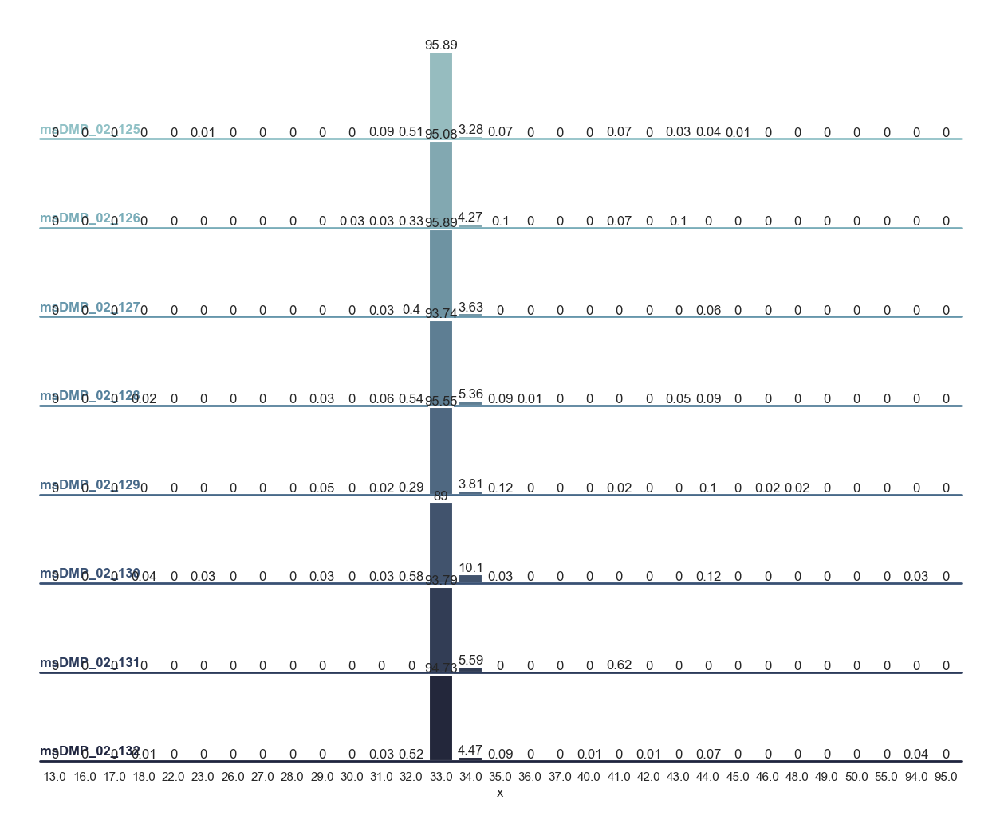

In [61]:
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

x = og_try_this_plt['length'].astype(int)
g = np.tile(list(to_plot_), 31)
df = pd.DataFrame(dict(x=x, g=g))

pal = sns.cubehelix_palette(8, rot=-.25, light=.7)
g = sns.FacetGrid(df, row="g", hue="g", aspect=10, height=1.25, palette=pal)

g.map(sns.barplot, "x", y = og_try_this_plt['pct'].round(decimals = 2),
      clip_on=(24, 44), fill=True, alpha=1, linewidth=1.5)

g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)

def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .1, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)

g.map(label, "x")

g.figure.subplots_adjust(hspace=-.03)

g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)

for x in range(len(og_try_this_plt['biosample'].unique())):
    ax = g.axes[x, 0]
    ax.bar_label(ax.containers[0])

plt.savefig('msDMP2_len_dist_{0}.pdf'.format(set_to_plt))

### generate a nested dictionary of unique new spacers found and their frequency

In [67]:
dict_spacers_counters = {}

for condition in new_spacers_all:
    spcr_counter = Counter(new_spacers_all[condition])
    print (len(spcr_counter), "unique new spacers seen")
    dict_spacers_counters[condition] = spcr_counter

2638 unique new spacers seen
4012 unique new spacers seen
4846 unique new spacers seen
5140 unique new spacers seen
4937 unique new spacers seen
2844 unique new spacers seen
2566 unique new spacers seen
1001 unique new spacers seen
1434 unique new spacers seen
2575 unique new spacers seen
3974 unique new spacers seen
1404 unique new spacers seen
7418 unique new spacers seen
1732 unique new spacers seen
3675 unique new spacers seen
1175 unique new spacers seen
4896 unique new spacers seen
137 unique new spacers seen
1232 unique new spacers seen
6160 unique new spacers seen
3797 unique new spacers seen
4272 unique new spacers seen
2060 unique new spacers seen
4150 unique new spacers seen


In [68]:
dict_spacers_counters

{'msDMP_02_132': Counter({'GGTTGGTGTCTTTTTTACCTGTTTGAGCGGCCG': 5,
          'GTTCCCACTGCGATGCTGGTTGCCAACGATCAG': 432,
          'GCGAAATGTAGTGCTTACGTTGTCCCGCATTTG': 477,
          'GAGTATGAGGGAAGCGGTGATCGCCGAAGTATC': 35,
          'CAGAAGTGCGTAGGTTGCCCGCACGCGACTGCC': 2,
          'GCAGGATGGATTTGGTTTCCTCCGTTCCGCAGA': 1,
          'GGCACAAACCGGGCAAACGCTAAAACGCGAAAT': 1,
          'GAATTTGTCCACTACGTGAAAGGCGAGATCACC': 25,
          'GCGCGGAGGTACATTTTCAGTGACCACGACGAA': 1,
          'GAAACGACGCAATCCCAACTCGGTCAAACAGGT': 2,
          'ATGCAGTGTACCCGCGGCAAGACGGAAAGACCC': 1,
          'GTTGTAATTCTCATGTTAGTCATGCCCCGCGCCC': 10,
          'ATTGTCGCGGCGATTAAATCTCGCGCCGATCAA': 2,
          'TTCTGCGTGCGGTAGATCGCTTCGATTTAATTG': 2,
          'GGCTAAACCCGCTCAATCGCTAAACTGCGTAAT': 1,
          'TCAAGGGCATCGGTCGAGATCCCGGTGCCTAAT': 2,
          'AGTCTCGCATTGTTTCAGACCGACACTGATGAT': 1,
          'GCCTGTCTAGCTTCAAGTATGACGGGCTGATAC': 12,
          'GTGGAAGCGGCGATGGCGGAGATGAATTACATT': 1,
          'GGTGATGATTTCTC

### generate fasta files of new spacers and their counts, to be used for BLASTing

In [14]:
for file_ in dict_spacers_counters:
    print (file_)
    with open("{0}_new_spacers.fasta".format(file_), 'w') as f:
        for g in dict_spacers_counters[file_]:
            f.write(">{0}-{1}-{2}\n{3}\n".format(file_,g, dict_spacers_counters[file_][g], g))

msDMP_02_132
msDMP_02_125
msDMP_02_128
msDMP_02_118
msDMP_02_122
msDMP_02_112
msDMP_02_115
msDMP_02_124
msDMP_02_126
msDMP_02_129
msDMP_02_130
msDMP_02_111
msDMP_02_119
msDMP_02_116
msDMP_02_121
msDMP_02_114
msDMP_02_113
msDMP_02_131
msDMP_02_127
msDMP_02_120
msDMP_02_117
msDMP_02_123
msDMP_02_110
msDMP_02_109


### for each file of new spacers, BLAST the spacers against the ref. K-12 *E. coli* and lambda genomes, as well as against the plasmids used in the experiments

In [51]:
for file_ in dict_spacers_counters:
    query = "{0}_new_spacers.fasta".format(file_)
    print (query)
    cmd = "blastn -query {0} -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out {1}_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145".format(query, query)
    print (cmd)
    os.system(cmd)

    cmd3 = "blastn -query {0} -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out {1}_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69".format(query, query)
    print (cmd3)
    os.system(cmd3)
    
    ##############################################################################
    ### uncomment these lines only when looking at phage infection experiments ### 
    ##############################################################################
    
    # cmd2 = "blastn -query {0} -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out {1}_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611".format(query, query)
    # print (cmd2)
    # os.system(cmd2)
    
    # cmd4 = "blastn -query {0} -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out {1}_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70".format(query, query)
    # print (cmd4)
    # os.system(cmd4)

    # cmd5 = "blastn -query {0} -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out {1}_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71".format(query, query)
    # print (cmd5)
    # os.system(cmd5)

msMRM_12_348_new_spacers.fasta
blastn -query msMRM_12_348_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_348_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_348_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_348_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_348_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_348_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_348_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_348_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_348_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_348_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_328_new_spacers.fasta
blastn -query msMRM_12_328_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_328_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_328_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_328_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_328_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_328_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_328_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_328_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_328_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_328_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_358_new_spacers.fasta
blastn -query msMRM_12_358_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_358_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_358_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_358_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_358_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_358_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_358_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_358_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_358_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_358_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_366_new_spacers.fasta
blastn -query msMRM_12_366_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_366_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_366_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_366_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_366_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_366_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_366_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_366_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_366_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_366_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_340_new_spacers.fasta
blastn -query msMRM_12_340_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_340_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_340_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_340_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_340_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_340_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_340_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_340_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_340_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_340_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_360_new_spacers.fasta
blastn -query msMRM_12_360_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_360_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_360_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_360_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_360_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_360_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_360_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_360_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_360_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_360_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_338_new_spacers.fasta
blastn -query msMRM_12_338_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_338_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_338_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_338_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_338_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_338_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_338_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_338_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_338_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_338_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_341_new_spacers.fasta
blastn -query msMRM_12_341_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_341_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_341_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_341_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_341_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_341_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_341_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_341_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_341_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_341_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_377_new_spacers.fasta
blastn -query msMRM_12_377_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_377_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_377_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_377_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_377_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_377_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_377_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_377_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_377_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_377_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_365_new_spacers.fasta
blastn -query msMRM_12_365_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_365_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_365_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_365_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_365_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_365_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_365_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_365_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_365_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_365_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_374_new_spacers.fasta
blastn -query msMRM_12_374_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_374_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_374_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_374_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_374_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_374_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_374_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_374_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_374_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_374_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_346_new_spacers.fasta
blastn -query msMRM_12_346_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_346_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_346_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_346_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_346_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_346_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_346_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_346_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_346_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_346_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_350_new_spacers.fasta
blastn -query msMRM_12_350_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_350_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_350_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_350_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_350_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_350_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_350_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_350_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_350_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_350_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_335_new_spacers.fasta
blastn -query msMRM_12_335_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_335_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_335_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_335_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_335_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_335_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_335_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_335_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_335_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_335_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_334_new_spacers.fasta
blastn -query msMRM_12_334_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_334_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_334_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_334_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_334_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_334_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_334_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_334_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_334_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_334_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_373_new_spacers.fasta
blastn -query msMRM_12_373_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_373_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_373_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_373_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_373_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_373_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_373_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_373_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_373_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_373_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_356_new_spacers.fasta
blastn -query msMRM_12_356_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_356_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_356_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_356_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_356_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_356_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_356_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_356_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_356_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_356_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_363_new_spacers.fasta
blastn -query msMRM_12_363_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_363_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_363_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_363_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_363_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_363_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_363_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_363_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_363_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_363_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_370_new_spacers.fasta
blastn -query msMRM_12_370_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_370_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_370_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_370_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_370_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_370_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_370_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_370_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_370_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_370_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_343_new_spacers.fasta
blastn -query msMRM_12_343_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_343_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_343_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_343_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_343_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_343_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_343_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_343_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_343_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_343_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_333_new_spacers.fasta
blastn -query msMRM_12_333_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_333_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_333_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_333_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_333_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_333_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_333_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_333_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_333_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_333_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_375_new_spacers.fasta
blastn -query msMRM_12_375_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_375_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_375_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_375_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_375_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_375_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_375_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_375_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_375_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_375_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_342_new_spacers.fasta
blastn -query msMRM_12_342_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_342_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_342_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_342_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_342_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_342_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_342_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_342_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_342_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_342_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_355_new_spacers.fasta
blastn -query msMRM_12_355_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_355_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_355_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_355_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_355_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_355_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_355_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_355_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_355_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_355_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_351_new_spacers.fasta
blastn -query msMRM_12_351_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_351_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_351_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_351_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_351_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_351_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_351_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_351_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_351_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_351_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_354_new_spacers.fasta
blastn -query msMRM_12_354_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_354_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_354_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_354_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_354_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_354_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_354_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_354_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_354_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_354_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_349_new_spacers.fasta
blastn -query msMRM_12_349_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_349_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_349_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_349_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_349_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_349_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_349_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_349_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_349_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_349_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_347_new_spacers.fasta
blastn -query msMRM_12_347_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_347_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_347_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_347_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_347_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_347_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_347_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_347_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_347_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_347_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_362_new_spacers.fasta
blastn -query msMRM_12_362_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_362_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_362_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_362_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_362_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_362_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_362_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_362_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_362_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_362_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_339_new_spacers.fasta
blastn -query msMRM_12_339_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_339_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_339_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_339_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_339_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_339_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_339_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_339_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_339_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_339_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_330_new_spacers.fasta
blastn -query msMRM_12_330_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_330_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_330_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_330_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_330_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_330_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_330_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_330_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_330_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_330_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_352_new_spacers.fasta
blastn -query msMRM_12_352_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_352_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_352_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_352_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_352_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_352_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_352_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_352_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_352_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_352_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_353_new_spacers.fasta
blastn -query msMRM_12_353_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_353_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_353_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_353_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_353_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_353_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_353_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_353_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_353_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_353_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_369_new_spacers.fasta
blastn -query msMRM_12_369_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_369_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_369_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_369_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_369_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_369_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_369_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_369_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_369_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_369_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_367_new_spacers.fasta
blastn -query msMRM_12_367_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_367_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_367_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_367_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_367_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_367_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_367_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_367_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_367_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_367_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_372_new_spacers.fasta
blastn -query msMRM_12_372_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_372_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_372_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_372_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_372_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_372_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_372_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_372_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_372_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_372_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_376_new_spacers.fasta
blastn -query msMRM_12_376_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_376_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_376_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_376_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_376_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_376_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_376_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_376_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_376_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_376_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_359_new_spacers.fasta
blastn -query msMRM_12_359_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_359_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_359_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_359_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_359_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_359_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_359_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_359_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_359_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_359_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_331_new_spacers.fasta
blastn -query msMRM_12_331_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_331_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_331_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_331_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_331_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_331_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_331_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_331_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_331_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_331_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_371_new_spacers.fasta
blastn -query msMRM_12_371_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_371_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_371_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_371_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_371_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_371_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_371_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_371_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_371_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_371_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_357_new_spacers.fasta
blastn -query msMRM_12_357_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_357_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_357_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_357_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_357_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_357_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_357_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_357_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_357_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_357_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_332_new_spacers.fasta
blastn -query msMRM_12_332_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_332_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_332_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_332_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_332_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_332_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_332_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_332_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_332_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_332_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_344_new_spacers.fasta
blastn -query msMRM_12_344_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_344_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_344_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_344_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_344_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_344_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_344_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_344_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_344_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_344_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_368_new_spacers.fasta
blastn -query msMRM_12_368_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_368_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_368_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_368_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_368_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_368_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_368_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_368_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_368_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_368_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_364_new_spacers.fasta
blastn -query msMRM_12_364_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_364_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_364_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_364_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_364_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_364_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_364_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_364_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_364_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_364_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_329_new_spacers.fasta
blastn -query msMRM_12_329_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_329_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_329_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_329_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_329_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_329_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_329_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_329_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_329_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_329_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_337_new_spacers.fasta
blastn -query msMRM_12_337_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_337_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_337_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_337_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_337_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_337_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_337_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_337_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_337_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_337_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_336_new_spacers.fasta
blastn -query msMRM_12_336_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_336_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_336_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_336_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_336_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_336_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_336_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_336_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_336_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_336_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_345_new_spacers.fasta
blastn -query msMRM_12_345_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_345_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_345_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_345_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_345_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_345_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_345_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_345_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_345_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_345_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


msMRM_12_361_new_spacers.fasta
blastn -query msMRM_12_361_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/MG1655.fasta -out msMRM_12_361_new_spacers.fasta_blast_EC.xml -outfmt 5 -subject_besthit -max_target_seqs 1 -qcov_hsp_perc 90 -taxids 511145


blastn -query msMRM_12_361_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL565.fasta -out msMRM_12_361_new_spacers.fasta_blast_565.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 69


blastn -query msMRM_12_361_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/lambda.fasta -out msMRM_12_361_new_spacers.fasta_blast_lambda.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 2681611


blastn -query msMRM_12_361_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL787.fasta -out msMRM_12_361_new_spacers.fasta_blast_787.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 70


blastn -query msMRM_12_361_new_spacers.fasta -task blastn-short -db /usr/local/ncbi/blast/db/pSCL788.fasta -out msMRM_12_361_new_spacers.fasta_blast_788.xml -outfmt 5 -subject_besthit -max_target_seqs 1  -qcov_hsp_perc 90 -taxids 71


### import the annotation files for each reference genome; for *E. coli* and lambda, fetch and use the genbank files

In [15]:
pscl565_df_gtf = gffpd.read_gff3('pSCL565_.gff').df
pscl787_df_gtf = gffpd.read_gff3('pSCL787.gff').df
pscl788_df_gtf = gffpd.read_gff3('pSCL788.gff').df

In [16]:
pscl565_df_gtf = pscl565_df_gtf[~pscl565_df_gtf['type'].str.contains('invisible')]
pscl565_df_gtf = pscl565_df_gtf[~pscl565_df_gtf['type'].str.contains('extracted')]

In [17]:
pscl787_df_gtf = pscl787_df_gtf[~pscl787_df_gtf['type'].str.contains('invisible')]
pscl787_df_gtf = pscl787_df_gtf[~pscl787_df_gtf['type'].str.contains('extracted')]

In [18]:
pscl788_df_gtf = pscl788_df_gtf[~pscl788_df_gtf['type'].str.contains('invisible')]
pscl788_df_gtf = pscl788_df_gtf[~pscl788_df_gtf['type'].str.contains('extracted')]

In [19]:
# Download MG1655 gb
gbk_fetch_data_ec = fetch_genbank_by_accid("NC_000913.3")
gbk_ec = Genbank(gbk_fetch_data_ec)

# Download lambda gb
gbk_fetch_data_lambda = fetch_genbank_by_accid("NC_001416.1")
gbk_lambda = Genbank(gbk_fetch_data_lambda)

### generate a dict of filtered BLAST hits, removing lacI and cas1 from genome hits 

In [69]:
genes_seen = {}

for file_ in dict_spacers_counters:
    print (file_)
    for blast_rez in glob.glob("{0}_new_spacers.fasta*.xml".format(file_)):
        if "EC" in blast_rez:
            genes_df = gbk_ec
        elif "lambda" in blast_rez:
            genes_df = gbk_lambda
        elif "565" in blast_rez:
            genes_df = pscl565_df_gtf
        elif "787" in blast_rez:
            genes_df = pscl787_df_gtf
        elif "788" in blast_rez:
            genes_df = pscl788_df_gtf
        filtered_ = []
        print (blast_rez)
        result_handle = open(blast_rez)
        blast_records = NCBIXML.parse(result_handle)
        try:
            blast_records = list(blast_records)
            print (len(blast_records))
            for r in blast_records:
                if len(list(r.alignments))>0:
                    if ('EC' in blast_rez):
                        s,e = r.alignments[0].hsps[0].sbjct_start, r.alignments[0].hsps[0].sbjct_end
                        for rec in gbk_ec.records:
                            #print (r)
                            for f in rec.features[1:]:
                                start, end = int(f.location.start), int(f.location.end)
                                if ((start <= s) and (end >=e)):
                                    if (('lacI' in str(f)) or ('cas1' in str(f)) or ('cas2' in str(f))):
                                        pass
                                    else:
                                        filtered_.append(r)
                    else:
                        filtered_.append(r)
                else:
                    pass
            print (len(list(set(filtered_))))
            genes_seen[blast_rez] = list(set(filtered_))
        except:
            pass


msDMP_02_132
msDMP_02_132_new_spacers.fasta_blast_EC.xml
2638
864
msDMP_02_132_new_spacers.fasta_blast_565.xml
2638
1392
msDMP_02_125
msDMP_02_125_new_spacers.fasta_blast_EC.xml
4012
497
msDMP_02_125_new_spacers.fasta_blast_565.xml
4012
3156
msDMP_02_128
msDMP_02_128_new_spacers.fasta_blast_EC.xml
4846
1053
msDMP_02_128_new_spacers.fasta_blast_565.xml
4846
3240
msDMP_02_118
msDMP_02_118_new_spacers.fasta_blast_EC.xml
5140
495
msDMP_02_118_new_spacers.fasta_blast_565.xml
5140
4035
msDMP_02_122
msDMP_02_122_new_spacers.fasta_blast_EC.xml
4937
411
msDMP_02_122_new_spacers.fasta_blast_565.xml
msDMP_02_112
msDMP_02_112_new_spacers.fasta_blast_565.xml
2844
2210
msDMP_02_112_new_spacers.fasta_blast_EC.xml
2844
301
msDMP_02_115
msDMP_02_115_new_spacers.fasta_blast_EC.xml
2566
349
msDMP_02_115_new_spacers.fasta_blast_565.xml
2566
1973
msDMP_02_124
msDMP_02_124_new_spacers.fasta_blast_565.xml
1001
750
msDMP_02_124_new_spacers.fasta_blast_EC.xml
1001
147
msDMP_02_126
msDMP_02_126_new_spacers.fast

### only for psAA33 fed samples: look for that prespacer instead of lambda

In [235]:
set_to_plt = "C"
to_plot_ = list(samples[samples['run']==set_to_plt]['sample_name'])
print(len(to_plot_))
print (to_plot_)

3
['msMRM_12_340', 'msMRM_12_341', 'msMRM_12_342']


In [236]:
genes_seen = {}

for file_ in to_plot_:
    print (file_)
    for blast_rez in glob.glob("{0}_new_spacers.fasta*.xml".format(file_)):
        if "EC" in blast_rez:
            genes_df = gbk_ec
        elif "lambda" in blast_rez:
            genes_df = gbk_lambda
        elif "565" in blast_rez:
            genes_df = pscl565_df_gtf
        elif "787" in blast_rez:
            genes_df = pscl787_df_gtf
        elif "788" in blast_rez:
            genes_df = pscl788_df_gtf
        filtered_ = []
        print (blast_rez)
        result_handle = open(blast_rez)
        blast_records = NCBIXML.parse(result_handle)
        try:
            blast_records = list(blast_records)
            print (len(blast_records))
            for r in blast_records:
                if len(list(r.alignments))>0:
                    if ('EC' in blast_rez):
                        s,e = r.alignments[0].hsps[0].sbjct_start, r.alignments[0].hsps[0].sbjct_end
                        for rec in gbk_ec.records:
                            for f in rec.features[1:]:
                                start, end = int(f.location.start), int(f.location.end)
                                if ((start <= s) and (end >=e)):
                                    if (('lacI' in str(f)) or ('cas1' in str(f)) or ('cas2' in str(f))):
                                        pass
                                    else:
                                        filtered_.append(r)
                    else:
                        filtered_.append(r)
                else:
                    spcr = r.query.split('-')[1]
                    try:
                        if len(fuzzysearch.find_near_matches(spcr, 'GCCCAATTTACTACTCGTTCTGGTGTTTCTCGT', max_l_dist=1))>0:
                            print ('found?')
                            print (spcr)
                            filtered_.append(r)
                    except ValueError as e:
                        print (e)
            print (len(list(set(filtered_))))
            genes_seen[blast_rez] = list(set(filtered_))
        except ValueError as e:
            print (e)
            print (r)


msMRM_12_340
msMRM_12_340_new_spacers.fasta_blast_787.xml
248
found?
GCCCAATTTACTACTCGTTCTGGTGTTTCTCGT
11
msMRM_12_340_new_spacers.fasta_blast_EC.xml
248
found?
GCCCAATTTACTACTCGTTCTGGTGTTTCTCGT
53
msMRM_12_340_new_spacers.fasta_blast_lambda.xml
248
found?
GCCCAATTTACTACTCGTTCTGGTGTTTCTCGT
3
msMRM_12_340_new_spacers.fasta_blast_565.xml
248
found?
GCCCAATTTACTACTCGTTCTGGTGTTTCTCGT
167
msMRM_12_340_new_spacers.fasta_blast_788.xml
248
found?
GCCCAATTTACTACTCGTTCTGGTGTTTCTCGT
9
msMRM_12_341
msMRM_12_341_new_spacers.fasta_blast_565.xml
Your XML file was empty
msMRM_12_341_new_spacers.fasta_blast_lambda.xml
Your XML file was empty
msMRM_12_341_new_spacers.fasta_blast_788.xml
Your XML file was empty
msMRM_12_341_new_spacers.fasta_blast_EC.xml
Your XML file was empty
msMRM_12_341_new_spacers.fasta_blast_787.xml
Your XML file was empty
msMRM_12_342
msMRM_12_342_new_spacers.fasta_blast_788.xml
100
Given subsequence is empty!
found?
GCCCAATTTACTACTCGTTCTGGTGTTTCTCGT
found?
TCCCAATTTACTACTCGTTCTGG

In [237]:
genes_seen.keys()

dict_keys(['msMRM_12_340_new_spacers.fasta_blast_787.xml', 'msMRM_12_340_new_spacers.fasta_blast_EC.xml', 'msMRM_12_340_new_spacers.fasta_blast_lambda.xml', 'msMRM_12_340_new_spacers.fasta_blast_565.xml', 'msMRM_12_340_new_spacers.fasta_blast_788.xml', 'msMRM_12_342_new_spacers.fasta_blast_788.xml', 'msMRM_12_342_new_spacers.fasta_blast_565.xml', 'msMRM_12_342_new_spacers.fasta_blast_EC.xml', 'msMRM_12_342_new_spacers.fasta_blast_787.xml', 'msMRM_12_342_new_spacers.fasta_blast_lambda.xml'])

In [251]:
occupancy_all = {}
spacer_count_per_location = {}
unique_spacer_count_per_location = {}

for fn_ in to_plot_:
    print (fn_)
    unique_spacer_count_per_location[fn_] = {"EC_genome": 0,
                                        "psAA33": 0,
                                        "plasmids": 0}
    spacer_count_per_location[fn_] = {"EC_genome": 0,
                                        "psAA33": 0,
                                        "plasmids": 0}
    
    for blast_rez in [fn_+'_new_spacers.fasta_blast_EC.xml', fn_+'_new_spacers.fasta_blast_565.xml']:    
        print (blast_rez)
        if "EC" in blast_rez:
            add_to = "EC_genome"
            genes_df = gbk_ec
            genome_size = 4641652
    
        elif "lambda" in blast_rez:
            add_to = "lambda"
            genes_df = gbk_lambda
            genome_size = 48502
            
        elif "565" in blast_rez:
            add_to = "plasmids"
            genes_df = pscl565_df_gtf
            genome_size = 4832
        
        elif "787" in blast_rez:
            add_to = "plasmids"
            genes_df = pscl787_df_gtf
            genome_size = 3456
        
        elif "788" in blast_rez:
            add_to = "plasmids"
            genes_df = pscl788_df_gtf
            genome_size = 3456
        
        occupancy = np.zeros(genome_size)
        try:
            blast_records = genes_seen[blast_rez]
            guide_count = 0
            unique_count = 0
            for r in blast_records:
                guide, count = r.query.split('-')[-2], float(r.query.split('-')[-1])
                print (guide, count)                
                if len(list(r.alignments))>0:
                    s,e = int(r.alignments[0].hsps[0].sbjct_start), int(r.alignments[0].hsps[0].sbjct_end)
                    if e > s:
                        if e - s == 32:
                            start = s-1
                            end = e
                            occupancy[start:end] = occupancy[start:end] + count
                        else: 
                            if s+32>=genome_size:
                                occupancy[e-1:genome_size] = occupancy[e-1:genome_size] + count
                                occupancy[0:s] = occupancy[0:s] + count  
                            else:
                                pass
                    else:
                        if s-e == 32:
                            start = e-1
                            end = s 
                            occupancy[start:end] = occupancy[start:end] + count
        
                        else:
                            if e+32>=genome_size:
                                occupancy[s-1:genome_size] = occupancy[s-1:genome_size] + count
                                occupancy[0:e] = occupancy[0:e] + count 
                            else:
                                pass
                    unique_count +=1
                    guide_count += count
                else:
                    spcr = r.query.split('-')[1]
                    try:
                        if len(fuzzysearch.find_near_matches(spcr, 'GCCCAATTTACTACTCGTTCTGGTGTTTCTCGT', max_l_dist=1))>0:
                            print ('found?')
                            print (spcr)
                            unique_spacer_count_per_location[fn_]["psAA33"] += 1
                            print (guide_count)
                            spacer_count_per_location[fn_]["psAA33"] += guide_count
                    except ValueError as e:
                        print (e)
                occupancy = occupancy
                occupancy_all[blast_rez] = occupancy
            spacer_count_per_location[fn_][add_to] += guide_count   
            unique_spacer_count_per_location[fn_][add_to] += unique_count

            print (spacer_count_per_location)
            print (unique_spacer_count_per_location)
        except KeyError as k:
            print (k)

msMRM_12_340
msMRM_12_340_new_spacers.fasta_blast_EC.xml
GCCCTGCCTGCCAGTTGTCGACTTTGACACCCA 1.0
GATAAAGAGTTTTCCGGCTGTAACCGCGCGATG 1.0
GCACAAATAGCCGGAAGCCAAGGCGTTGTTCCA 1.0
GTTCACTGCGCGTGGTGTCAGCAGATGGATCGC 1.0
GCGATCGGCTAGCCATCCGCTTACCGGAATAAG 1.0
GCAAAGTGGCAATCCTCAACGGTGCGCACACCG 1.0
ACTATTCGTACCGCTCACCGTCGTACCGTTAGT 3.0
GGCGATATCTACAGCCGCGCCTACGCCGGTGAA 1.0
GATTAACCATGTTTTGTTTACGGATATTAATAC 1.0
GGCAGGAGGGCGATTGTCGCCTGACCCAAAATC 4.0
GTAGTAGAACGGGTTATTGCCCGTGCCATTTCAC 3.0
GGTAACGTGGAGTATTGGGTTGCCTTGATTCAG 2.0
ATCCACCGGCGTTGAGGCGTCTATTCAGGTCAA 1.0
GCTAACGGTAAAGTGTACGTAGAAAAAGGCCGC 2.0
CACCACGCTCTACGCCATCCTTTCGGCGCTGAA 1.0
GTACACGCTGAAGATCTTCAGTCTTGAGATAAT 2.0
TATACCACACACCGTCTGGTACGCCGACGATAT 1.0
GCCATCAGTCTGGCGTTGGAAAACCACGAATTC 1.0
GCGGTGCTCAGCATACGGCGAACATTATCTTCA 1.0
GTCAGACGCTTTCAGGTTACGCAGTTCGCTGCT 1.0
GTTCCGGCATCACCTGCGCCAGCGGTGTGTTGG 2.0
GAGTGGTTGCCGGTTTGTCGCGATATGCTCAAC 1.0
GATAGTGCCATGCCAGCGCCGTAGCCCCCGGAC 1.0
ACCGGAACGCAGCGCTCTGTCTGCCCACTGCGC 1.0
GCACAAATAGCCGAAAGCCAAGGCGTTGTT

In [248]:
unique_spacer_count_per_location

{'msMRM_12_340': {'EC_genome': 52, 'psAA33': 2, 'plasmids': 166},
 'msMRM_12_341': {'EC_genome': 0, 'psAA33': 0, 'plasmids': 0},
 'msMRM_12_342': {'EC_genome': 76, 'psAA33': 4, 'plasmids': 1}}

In [240]:
unique_spacer_count_per_location_norm = {}
for entry in unique_spacer_count_per_location:
    tot = sum(unique_spacer_count_per_location[entry].values())
    if tot >0:
        temp_ = {'EC_genome': 0, 'psAA33': 0, 'plasmids': 0}
        for location in spacer_count_per_location[entry]:
            temp_[location] =  (100*unique_spacer_count_per_location[entry][location])/tot
        unique_spacer_count_per_location_norm[entry] = temp_
unique_spacer_count_per_location_norm

{'msMRM_12_340': {'EC_genome': 23.636363636363637,
  'psAA33': 0.9090909090909091,
  'plasmids': 75.45454545454545},
 'msMRM_12_342': {'EC_genome': 93.82716049382717,
  'psAA33': 4.938271604938271,
  'plasmids': 1.2345679012345678}}

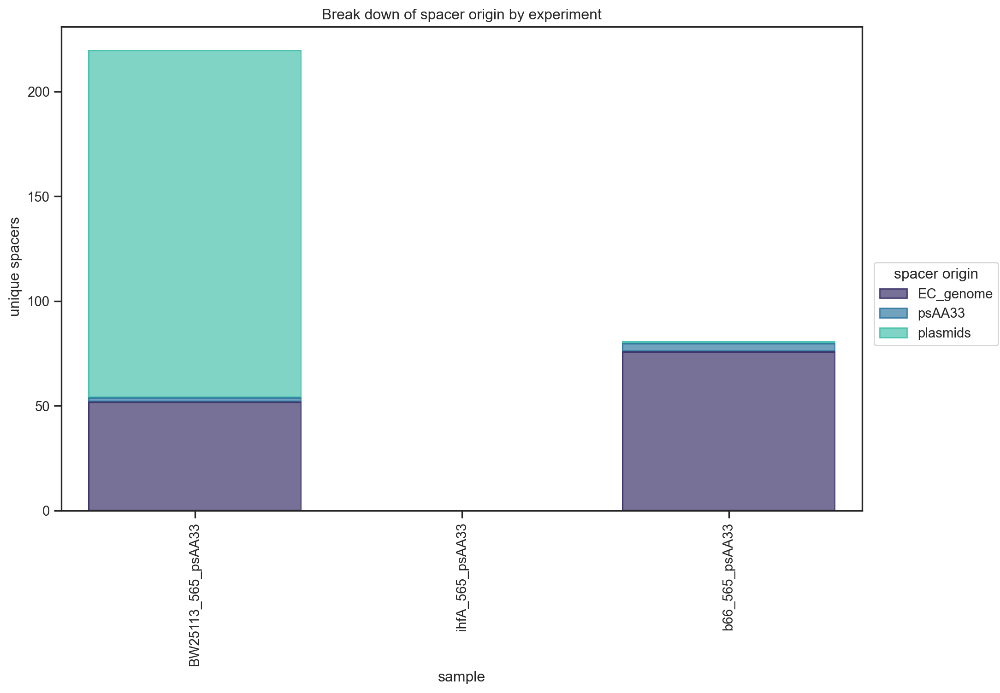

In [246]:
unique_spcr_loc_df = pd.DataFrame.from_dict(unique_spacer_count_per_location).T.reset_index().rename(columns = {'index': 'biosample'}).merge(samples[["sample_name", "Description"]], left_on='biosample', right_on='sample_name')
unique_spcr_loc_df = unique_spcr_loc_df[~unique_spcr_loc_df['Description'].str.contains('BL')]
unique_df_plt = unique_spcr_loc_df[['EC_genome', 'psAA33', 'plasmids', 'sample_name']].melt('sample_name',var_name='source', value_name='count')
unique_df_plt
unique_spcr_loc_df_norm = pd.DataFrame.from_dict(unique_spacer_count_per_location_norm).T.reset_index().rename(columns = {'index': 'biosample'}).merge(samples[["sample_name", "Description"]], left_on='biosample', right_on='sample_name')
unique_spcr_loc_df_norm = unique_spcr_loc_df_norm[~unique_spcr_loc_df_norm['Description'].str.contains('BL')]
unique_df_plt_norm = unique_spcr_loc_df_norm[['EC_genome', 'psAA33', 'plasmids', 'sample_name']].melt('sample_name',var_name='source', value_name='pct')
unique_df_plt_norm

try_this_plt = df_plt[df_plt['sample_name'].isin(to_plot_)]
try_this_plt_norm = df_plt_norm[df_plt_norm['sample_name'].isin(to_plot_)]
unique_try_this_plt = unique_df_plt[unique_df_plt['sample_name'].isin(to_plot_)]
unique_try_this_plt_norm = unique_df_plt_norm[unique_df_plt_norm['sample_name'].isin(to_plot_)]

try_this_plt = try_this_plt.merge(samples[["sample_name", "Description"]], left_on='sample_name', right_on='sample_name').drop('sample_name', axis=1)
try_this_plt_norm = try_this_plt_norm.merge(samples[["sample_name", "Description"]], left_on='sample_name', right_on='sample_name').drop('sample_name', axis=1)
unique_try_this_plt = unique_try_this_plt.merge(samples[["sample_name", "Description"]], left_on='sample_name', right_on='sample_name').drop('sample_name', axis=1)
unique_try_this_plt_norm = unique_try_this_plt_norm.merge(samples[["sample_name", "Description"]], left_on='sample_name', right_on='sample_name').drop('sample_name', axis=1)

g = (
    so.Plot(unique_try_this_plt, x="Description", y="count", color="source", )
    .add(so.Bar(), so.Stack())
    .layout(size=(10, 8), engine = 'tight')
    .theme(axes_style("ticks"))
    .scale(color="mako")
    .label(title="Break down of spacer origin by experiment", x="sample", y=" unique spacers", color="spacer origin")
).plot()

g._figure.axes[0].xaxis.set_tick_params(rotation=90)

g.save('unique_spcrs_origin_stacked_bars_msDMP2_{0}_psAA33.pdf'.format(set_to_plt), bbox_inches='tight')

In [70]:
glob.glob("*_new_spacers.fasta*.xml")

['msDMP_02_129_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_130_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_123_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_125_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_129_new_spacers.fasta_blast_565.xml',
 'msDMP_02_118_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_124_new_spacers.fasta_blast_565.xml',
 'msDMP_02_117_new_spacers.fasta_blast_565.xml',
 'msDMP_02_114_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_112_new_spacers.fasta_blast_565.xml',
 'msDMP_02_112_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_121_new_spacers.fasta_blast_565.xml',
 'msDMP_02_128_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_127_new_spacers.fasta_blast_565.xml',
 'msDMP_02_114_new_spacers.fasta_blast_565.xml',
 'msDMP_02_124_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_130_new_spacers.fasta_blast_565.xml',
 'msDMP_02_122_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_131_new_spacers.fasta_blast_EC.xml',
 'msDMP_02_111_new_spacers.fasta_blast_565.xml',
 'msDMP_02_122_new_spacers.fast

In [613]:
samples

,sample_name,Description,Sub-Library Owner,run
0,msDMP_02_109,BW25113_565_naive,SCL,A
1,msDMP_02_110,pcnB_565_naive,SCL,A
2,msDMP_02_111,sspA_565_naive,SCL,A
3,msDMP_02_112,uraA_565_naive,SCL,A
4,msDMP_02_113,osmF_565_naive,SCL,A
5,msDMP_02_114,polA-dKlenow_565_naive,SCL,A
6,msDMP_02_115,rclR_565_naive,SCL,A
7,msDMP_02_116,yeaO_565_naive,SCL,A
8,msDMP_02_117,mraZ_565_naive,SCL,A
9,msDMP_02_118,elaA_565_naive,SCL,A


In [72]:
genes_seen.keys()

dict_keys(['msDMP_02_132_new_spacers.fasta_blast_EC.xml', 'msDMP_02_132_new_spacers.fasta_blast_565.xml', 'msDMP_02_125_new_spacers.fasta_blast_EC.xml', 'msDMP_02_125_new_spacers.fasta_blast_565.xml', 'msDMP_02_128_new_spacers.fasta_blast_EC.xml', 'msDMP_02_128_new_spacers.fasta_blast_565.xml', 'msDMP_02_118_new_spacers.fasta_blast_EC.xml', 'msDMP_02_118_new_spacers.fasta_blast_565.xml', 'msDMP_02_122_new_spacers.fasta_blast_EC.xml', 'msDMP_02_112_new_spacers.fasta_blast_565.xml', 'msDMP_02_112_new_spacers.fasta_blast_EC.xml', 'msDMP_02_115_new_spacers.fasta_blast_EC.xml', 'msDMP_02_115_new_spacers.fasta_blast_565.xml', 'msDMP_02_124_new_spacers.fasta_blast_565.xml', 'msDMP_02_124_new_spacers.fasta_blast_EC.xml', 'msDMP_02_126_new_spacers.fasta_blast_565.xml', 'msDMP_02_126_new_spacers.fasta_blast_EC.xml', 'msDMP_02_129_new_spacers.fasta_blast_EC.xml', 'msDMP_02_129_new_spacers.fasta_blast_565.xml', 'msDMP_02_130_new_spacers.fasta_blast_EC.xml', 'msDMP_02_130_new_spacers.fasta_blast_56

# map spacers to genomes
### generates:
* occupancy arrays for each sample
* spacer counts per location (E. coli genome; lambda genome; or plasmids)
* *unique* spacer counts per location (i.e., not taking into account the frequency of seeing that spacer, given that it could be seen multiple times due to repeated sequencing of the same array / early expansion + propagation of that mother array into descendants / myriad other technical and biological reasons -- this is stringent)

In [21]:
occupancy_all = {}
spacer_count_per_location = {}
unique_spacer_count_per_location = {}

for fn_ in dict_spacers_counters:
    print (fn_)
    unique_spacer_count_per_location[fn_] = {"EC_genome": 0,
                                        "lambda": 0,
                                        "plasmids": 0}
    spacer_count_per_location[fn_] = {"EC_genome": 0,
                                        "lambda": 0,
                                        "plasmids": 0}
    for blast_rez in [fn_+'_new_spacers.fasta_blast_EC.xml', fn_+'_new_spacers.fasta_blast_565.xml',]:
        print (blast_rez)
        if "EC" in blast_rez:
            add_to = "EC_genome"
            genes_df = gbk_ec
            genome_size = 4641652
    
        elif "lambda" in blast_rez:
            add_to = "lambda"
            genes_df = gbk_lambda
            genome_size = 48502
            
        elif "565" in blast_rez:
            add_to = "plasmids"
            genes_df = pscl565_df_gtf
            genome_size = 4832
        
        elif "787" in blast_rez:
            add_to = "plasmids"
            genes_df = pscl787_df_gtf
            genome_size = 3456
        
        elif "788" in blast_rez:
            add_to = "plasmids"
            genes_df = pscl788_df_gtf
            genome_size = 3456
        
        occupancy = np.zeros(genome_size)
        try:
            blast_records = genes_seen[blast_rez]
            guide_count = 0
            unique_count = 0
            
            for r in blast_records:
                guide, count = r.query.split('-')[-2], float(r.query.split('-')[-1])
                if len(list(r.alignments))>0:
                    s,e = int(r.alignments[0].hsps[0].sbjct_start), int(r.alignments[0].hsps[0].sbjct_end)
                    if e > s:
                        if e - s == 32:
                            start = s-1
                            end = e
                            occupancy[start:end] = occupancy[start:end] + count
        
                        else: 
                            if s+32>=genome_size:
                                print ('alert e>s')
                                print (e,s)
                                occupancy[e-1:genome_size] = occupancy[e-1:genome_size] + count
                                occupancy[0:s] = occupancy[0:s] + count  
                            else:
                                pass
                    else:
                        if s-e == 32:
                            start = e-1
                            end = s 
                            occupancy[start:end] = occupancy[start:end] + count
        
                        else:
                            if e+32>=genome_size:
                                print ('alert s>e')
                                print (e,s)
                                occupancy[s-1:genome_size] = occupancy[s-1:genome_size] + count
                                occupancy[0:e] = occupancy[0:e] + count 
                            else:
                                pass
                    unique_count +=1
                    guide_count += count
        
                occupancy = occupancy
                occupancy_all[blast_rez] = occupancy
            spacer_count_per_location[fn_][add_to] += guide_count   
            unique_spacer_count_per_location[fn_][add_to] += unique_count
        except:
            pass

msDMP_02_132
msDMP_02_132_new_spacers.fasta_blast_EC.xml
msDMP_02_132_new_spacers.fasta_blast_565.xml
alert e>s
4832 4802
alert s>e
4801 4832
msDMP_02_125
msDMP_02_125_new_spacers.fasta_blast_EC.xml
msDMP_02_125_new_spacers.fasta_blast_565.xml
alert s>e
4801 4832
alert s>e
4801 4832
alert s>e
4802 4832
alert e>s
4832 4802
alert s>e
4801 4832
msDMP_02_128
msDMP_02_128_new_spacers.fasta_blast_EC.xml
msDMP_02_128_new_spacers.fasta_blast_565.xml
alert s>e
4802 4832
alert s>e
4801 4832
alert s>e
4802 4832
alert s>e
4801 4832
alert e>s
4832 4802
msDMP_02_118
msDMP_02_118_new_spacers.fasta_blast_EC.xml
msDMP_02_118_new_spacers.fasta_blast_565.xml
alert s>e
4801 4832
alert s>e
4803 4832
alert s>e
4802 4832
alert s>e
4801 4832
alert s>e
4802 4832
alert s>e
4803 4832
alert s>e
4801 4832
alert s>e
4801 4832
alert s>e
4802 4832
alert s>e
4801 4832
alert s>e
4801 4832
alert e>s
4832 4802
alert s>e
4801 4832
alert s>e
4801 4832
alert s>e
4801 4832
alert s>e
4801 4832
alert s>e
4801 4832
alert s>e
48

In [22]:
unique_spacer_count_per_location

{'msDMP_02_132': {'EC_genome': 864, 'lambda': 0, 'plasmids': 1392},
 'msDMP_02_125': {'EC_genome': 497, 'lambda': 0, 'plasmids': 3156},
 'msDMP_02_128': {'EC_genome': 1053, 'lambda': 0, 'plasmids': 3240},
 'msDMP_02_118': {'EC_genome': 495, 'lambda': 0, 'plasmids': 4035},
 'msDMP_02_122': {'EC_genome': 411, 'lambda': 0, 'plasmids': 0},
 'msDMP_02_112': {'EC_genome': 301, 'lambda': 0, 'plasmids': 2210},
 'msDMP_02_115': {'EC_genome': 349, 'lambda': 0, 'plasmids': 1973},
 'msDMP_02_124': {'EC_genome': 147, 'lambda': 0, 'plasmids': 750},
 'msDMP_02_126': {'EC_genome': 292, 'lambda': 0, 'plasmids': 964},
 'msDMP_02_129': {'EC_genome': 799, 'lambda': 0, 'plasmids': 1418},
 'msDMP_02_130': {'EC_genome': 621, 'lambda': 0, 'plasmids': 2871},
 'msDMP_02_111': {'EC_genome': 422, 'lambda': 0, 'plasmids': 822},
 'msDMP_02_119': {'EC_genome': 1787, 'lambda': 0, 'plasmids': 4690},
 'msDMP_02_116': {'EC_genome': 219, 'lambda': 0, 'plasmids': 1330},
 'msDMP_02_121': {'EC_genome': 0, 'lambda': 0, 'plas

In [71]:
spacer_count_per_location

{'msDMP_02_132': {'EC_genome': 1029.0, 'lambda': 0, 'plasmids': 5197.0},
 'msDMP_02_125': {'EC_genome': 918.0, 'lambda': 0, 'plasmids': 11910.0},
 'msDMP_02_128': {'EC_genome': 1257.0, 'lambda': 0, 'plasmids': 12990.0},
 'msDMP_02_118': {'EC_genome': 693.0, 'lambda': 0, 'plasmids': 22492.0},
 'msDMP_02_122': {'EC_genome': 533.0, 'lambda': 0, 'plasmids': 0},
 'msDMP_02_112': {'EC_genome': 392.0, 'lambda': 0, 'plasmids': 11928.0},
 'msDMP_02_115': {'EC_genome': 437.0, 'lambda': 0, 'plasmids': 7000.0},
 'msDMP_02_124': {'EC_genome': 163.0, 'lambda': 0, 'plasmids': 1566.0},
 'msDMP_02_126': {'EC_genome': 355.0, 'lambda': 0, 'plasmids': 2487.0},
 'msDMP_02_129': {'EC_genome': 1058.0, 'lambda': 0, 'plasmids': 4241.0},
 'msDMP_02_130': {'EC_genome': 793.0, 'lambda': 0, 'plasmids': 12894.0},
 'msDMP_02_111': {'EC_genome': 486.0, 'lambda': 0, 'plasmids': 1853.0},
 'msDMP_02_119': {'EC_genome': 2392.0, 'lambda': 0, 'plasmids': 30853.0},
 'msDMP_02_116': {'EC_genome': 784.0, 'lambda': 0, 'plasmid

In [23]:
samples

,sample_name,Description,Sub-Library Owner,run
0,msDMP_02_109,BW25113_565_naive,SCL,A
1,msDMP_02_110,pcnB_565_naive,SCL,A
2,msDMP_02_111,sspA_565_naive,SCL,A
3,msDMP_02_112,uraA_565_naive,SCL,A
4,msDMP_02_113,osmF_565_naive,SCL,A
5,msDMP_02_114,polA-dKlenow_565_naive,SCL,A
6,msDMP_02_115,rclR_565_naive,SCL,A
7,msDMP_02_116,yeaO_565_naive,SCL,A
8,msDMP_02_117,mraZ_565_naive,SCL,A
9,msDMP_02_118,elaA_565_naive,SCL,A


In [24]:
set_to_plt = "A"
to_plot_ = list(samples[samples['run']==set_to_plt]['sample_name'])
to_plot_

['msDMP_02_109',
 'msDMP_02_110',
 'msDMP_02_111',
 'msDMP_02_112',
 'msDMP_02_113',
 'msDMP_02_114',
 'msDMP_02_115',
 'msDMP_02_116',
 'msDMP_02_117',
 'msDMP_02_118',
 'msDMP_02_119',
 'msDMP_02_123',
 'msDMP_02_124']

### Extract 15bp up and downstream of the genomic origin of the new spacer to capture PAM and any discernible motifs

msDMP_02_109
msDMP_02_109_new_spacers.fasta_blast_EC.xml
list index out of range
list index out of range
781
781
781
781
msDMP_02_109_new_spacers.fasta_blast_565.xml
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
13684
13671
13684
13671
msDMP_02_109_new_spacers.fasta_blast_lambda.xml
'msDMP_02_109_new_spacers.fasta_blast_lambda.xml'
msDMP_02_109_new_spacers.fasta_blast_787.xml
'msDMP_02_109_new_spacers.fasta_blast_787.xml'
msDMP_02_109_new_spacers.fasta_blast_788.xml
'msDMP_02_109_new_space

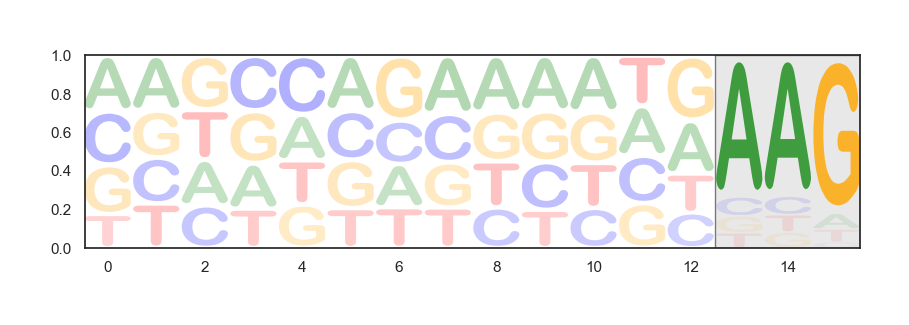

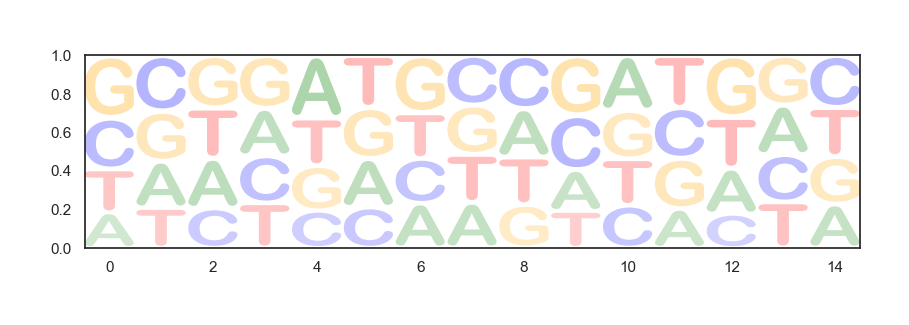

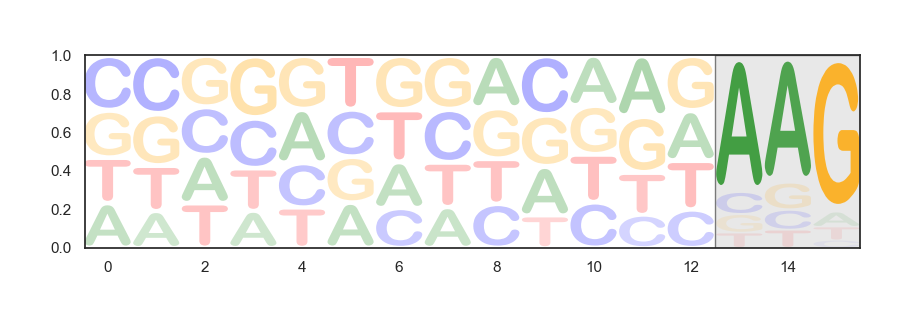

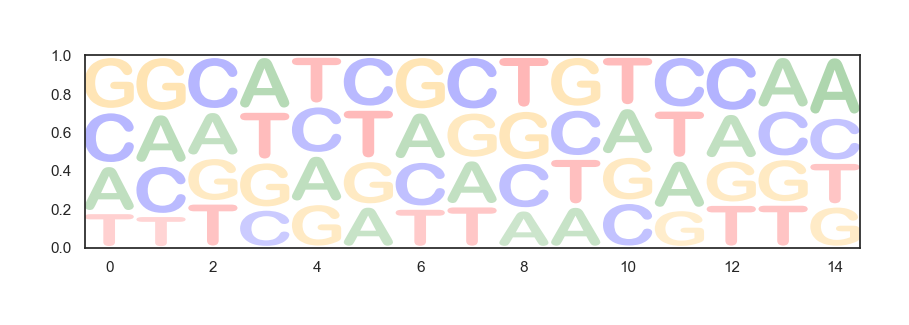

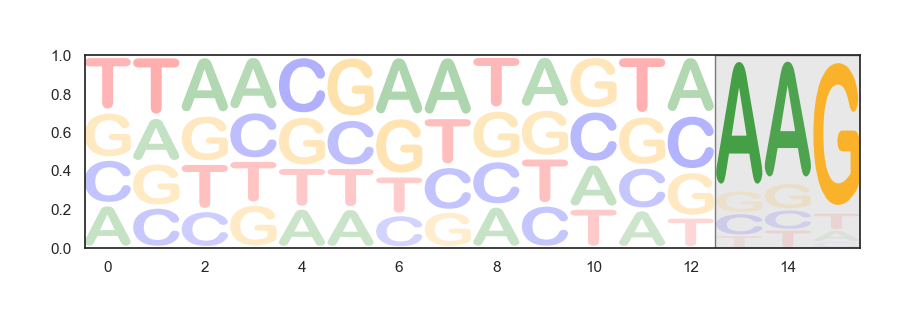

...

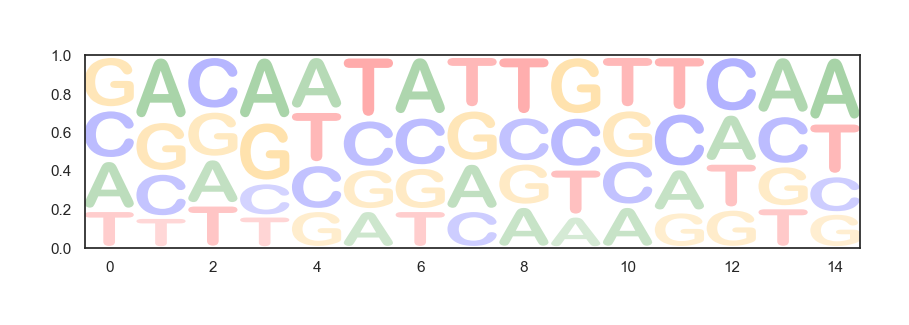

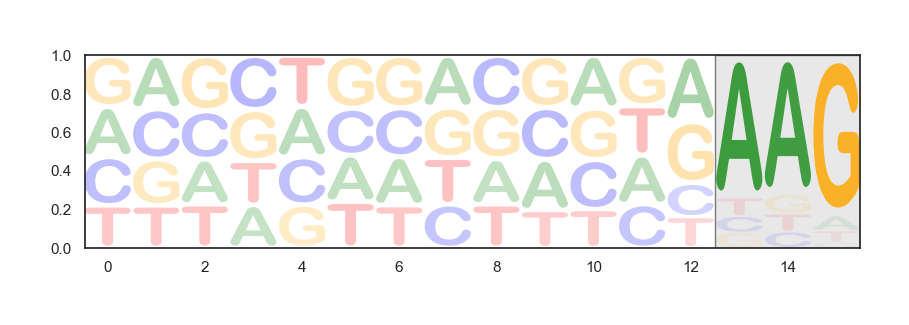

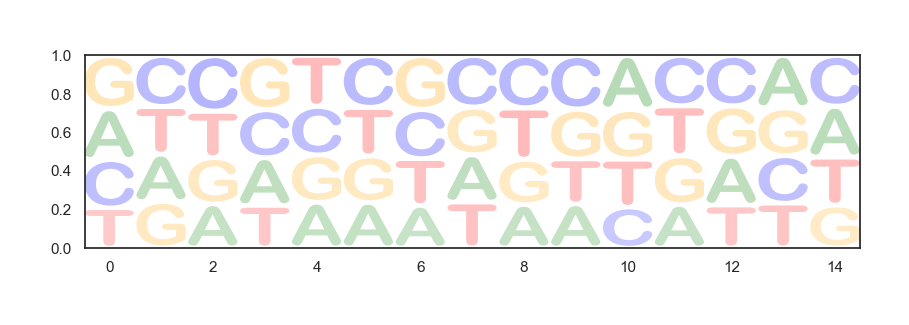

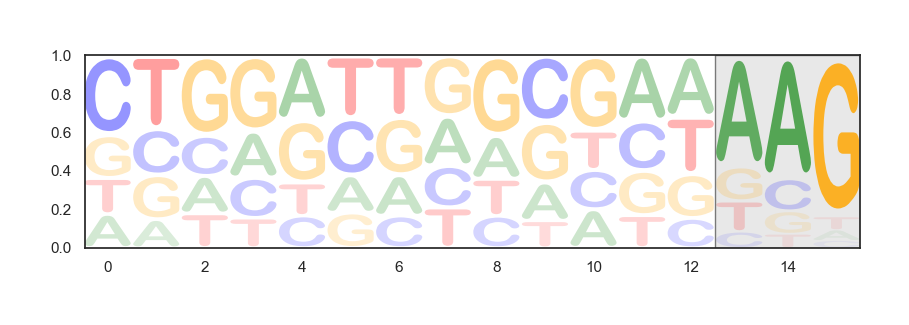

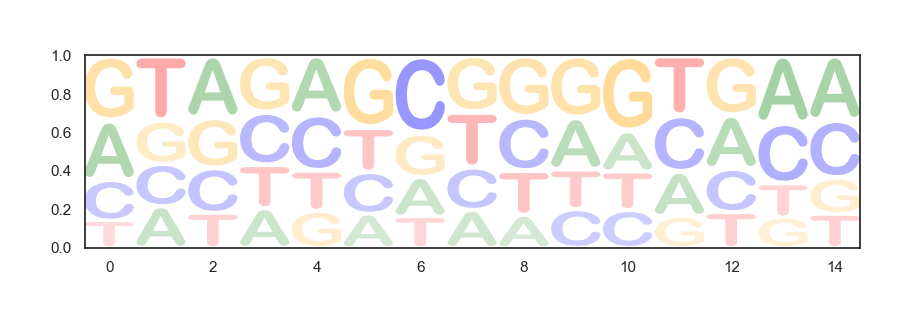

In [98]:
context_up = {}
context_down = {}
for fn_ in list(samples['sample_name']):
    print (fn_)
    for blast_rez in [fn_+'_new_spacers.fasta_blast_EC.xml', fn_+'_new_spacers.fasta_blast_565.xml',
                     fn_+'_new_spacers.fasta_blast_lambda.xml', fn_+'_new_spacers.fasta_blast_787.xml',
                     fn_+'_new_spacers.fasta_blast_788.xml']:   
        print (blast_rez)
        
        if "EC" in blast_rez:
            gnome_seq = SeqIO.parse(open('MG1655.fasta'),'fasta')
    
        elif "lambda" in blast_rez:
            gnome_seq = SeqIO.parse(open('lambda.fasta'),'fasta')
            
        elif "565" in blast_rez:
            gnome_seq = SeqIO.parse(open('pSCL565.fasta'),'fasta')
        
        elif "787" in blast_rez:
            gnome_seq = SeqIO.parse(open('pSCL787.fasta'),'fasta')
        
        elif "788" in blast_rez:
            gnome_seq = SeqIO.parse(open('pSCL788.fasta'),'fasta')

        cu = []
        cd = []
                
        for g in gnome_seq:
            gnome_seq = str(g.seq)
        try:     
            blast_records = genes_seen[blast_rez]
            for r in blast_records:
                guide, count = r.query.split('-')[-2], float(r.query.split('-')[-1])
                if len(list(r.alignments))>0:
                    try:
                        s,e = int(r.alignments[0].hsps[0].sbjct_start), int(r.alignments[0].hsps[0].sbjct_end)
                        if s>e: ## need to RC the seq to search for it
                            guide = str(Seq(guide).reverse_complement())
                            findit = fuzzysearch.find_near_matches(guide, gnome_seq, max_l_dist=3)[0]
                            good2go = str(Seq(gnome_seq[findit.start-15:findit.end+15]).reverse_complement())
                            cu.extend([str(good2go[:16])]*int(count))
                            cd.extend([str(good2go[-15:])]*int(count))
                        else:
                            findit = fuzzysearch.find_near_matches(guide, gnome_seq, max_l_dist=3)[0]
                            cu.extend([str(gnome_seq[findit.start-15:findit.start+1])]*int(count))
                            cd.extend([str(gnome_seq[findit.end:findit.end+15])]*int(count))
                    except IndexError as e:
                        print (e)
            print (len(cu))
            cu = [i for i in cu if len(i) == 16]            
            print (len(cu))
            print (len(cd))
            cd = [i for i in cd if len(i) == 15]
            print (len(cd))
            context_up[blast_rez] = cu
            context_down[blast_rez] = cd
            try:
                counts_mat_up = lm.transform_matrix(lm.alignment_to_matrix(cu), from_type='counts', to_type='probability')
                counts_mat_down = lm.transform_matrix(lm.alignment_to_matrix(cd), from_type='counts', to_type='probability')
                lu = lm.Logo(counts_mat_up, fade_probabilities=True, 
                             font_name='Arial Rounded MT Bold', vpad=0.1).highlight_position_range(13,16,alpha=0.5,color='lightgray', edgecolor='black')
                plt.savefig('{0}_15bp_up.pdf'.format(blast_rez))
                ld = lm.Logo(counts_mat_down, fade_probabilities=True, 
                             font_name='Arial Rounded MT Bold', vpad=0.1)
                plt.savefig('{0}_15bp_down.pdf'.format(blast_rez))
            except:
                pass
        except KeyError as e:
            print (e)

In [72]:
spacer_count_per_location

{'msDMP_02_132': {'EC_genome': 1029.0, 'lambda': 0, 'plasmids': 5197.0},
 'msDMP_02_125': {'EC_genome': 918.0, 'lambda': 0, 'plasmids': 11910.0},
 'msDMP_02_128': {'EC_genome': 1257.0, 'lambda': 0, 'plasmids': 12990.0},
 'msDMP_02_118': {'EC_genome': 693.0, 'lambda': 0, 'plasmids': 22492.0},
 'msDMP_02_122': {'EC_genome': 533.0, 'lambda': 0, 'plasmids': 0},
 'msDMP_02_112': {'EC_genome': 392.0, 'lambda': 0, 'plasmids': 11928.0},
 'msDMP_02_115': {'EC_genome': 437.0, 'lambda': 0, 'plasmids': 7000.0},
 'msDMP_02_124': {'EC_genome': 163.0, 'lambda': 0, 'plasmids': 1566.0},
 'msDMP_02_126': {'EC_genome': 355.0, 'lambda': 0, 'plasmids': 2487.0},
 'msDMP_02_129': {'EC_genome': 1058.0, 'lambda': 0, 'plasmids': 4241.0},
 'msDMP_02_130': {'EC_genome': 793.0, 'lambda': 0, 'plasmids': 12894.0},
 'msDMP_02_111': {'EC_genome': 486.0, 'lambda': 0, 'plasmids': 1853.0},
 'msDMP_02_119': {'EC_genome': 2392.0, 'lambda': 0, 'plasmids': 30853.0},
 'msDMP_02_116': {'EC_genome': 784.0, 'lambda': 0, 'plasmid

In [73]:
print (array_counts_all)
print (expanded_array_counts_all)

{'msDMP_02_109': 183750, 'msDMP_02_110': 164090, 'msDMP_02_111': 150917, 'msDMP_02_112': 133420, 'msDMP_02_113': 142983, 'msDMP_02_114': 153796, 'msDMP_02_115': 112254, 'msDMP_02_116': 68853, 'msDMP_02_117': 110244, 'msDMP_02_118': 128833, 'msDMP_02_119': 154825, 'msDMP_02_123': 177943, 'msDMP_02_124': 141485, 'msDMP_02_125': 155193, 'msDMP_02_126': 137658, 'msDMP_02_127': 137188, 'msDMP_02_128': 173202, 'msDMP_02_129': 180550, 'msDMP_02_130': 108083, 'msDMP_02_131': 12094, 'msDMP_02_132': 200441}
{'msDMP_02_109': 14132, 'msDMP_02_110': 6559, 'msDMP_02_111': 2456, 'msDMP_02_112': 11904, 'msDMP_02_113': 18188, 'msDMP_02_114': 1360, 'msDMP_02_115': 7019, 'msDMP_02_116': 4830, 'msDMP_02_117': 10633, 'msDMP_02_118': 20409, 'msDMP_02_119': 31145, 'msDMP_02_123': 12336, 'msDMP_02_124': 1806, 'msDMP_02_125': 12592, 'msDMP_02_126': 2966, 'msDMP_02_127': 3368, 'msDMP_02_128': 14120, 'msDMP_02_129': 5616, 'msDMP_02_130': 13099, 'msDMP_02_131': 154, 'msDMP_02_132': 6451}


### normalise spacer count per location to number of arrays sequenced

In [77]:
spacer_count_per_location_perarray = {}
for entry in spacer_count_per_location:
    print (entry)
    try:
        tot = array_counts_all[entry]
        temp_ = {'EC_genome': 0, 'lambda': 0, 'plasmids': 0}
        for location in spacer_count_per_location[entry]:
            temp_[location] =  (100*spacer_count_per_location[entry][location])/tot
        spacer_count_per_location_perarray[entry] = temp_
    
    except KeyError as e:
        print (e)
    
spacer_count_per_location_perarray

msDMP_02_132
msDMP_02_125
msDMP_02_128
msDMP_02_118
msDMP_02_122
'msDMP_02_122'
msDMP_02_112
msDMP_02_115
msDMP_02_124
msDMP_02_126
msDMP_02_129
msDMP_02_130
msDMP_02_111
msDMP_02_119
msDMP_02_116
msDMP_02_121
'msDMP_02_121'
msDMP_02_114
msDMP_02_113
msDMP_02_131
msDMP_02_127
msDMP_02_120
'msDMP_02_120'
msDMP_02_117
msDMP_02_123
msDMP_02_110
msDMP_02_109


{'msDMP_02_132': {'EC_genome': 0.5133680235081645,
  'lambda': 0.0,
  'plasmids': 2.5927829136753457},
 'msDMP_02_125': {'EC_genome': 0.5915215248110417,
  'lambda': 0.0,
  'plasmids': 7.674315207515803},
 'msDMP_02_128': {'EC_genome': 0.7257421969723213,
  'lambda': 0.0,
  'plasmids': 7.499913395919216},
 'msDMP_02_118': {'EC_genome': 0.5379056608167162,
  'lambda': 0.0,
  'plasmids': 17.458259917878184},
 'msDMP_02_112': {'EC_genome': 0.2938090241343127,
  'lambda': 0.0,
  'plasmids': 8.9401888772298},
 'msDMP_02_115': {'EC_genome': 0.38929570438469896,
  'lambda': 0.0,
  'plasmids': 6.235857964972295},
 'msDMP_02_124': {'EC_genome': 0.11520655899918719,
  'lambda': 0.0,
  'plasmids': 1.1068311128388169},
 'msDMP_02_126': {'EC_genome': 0.25788548431620395,
  'lambda': 0.0,
  'plasmids': 1.806651266181406},
 'msDMP_02_129': {'EC_genome': 0.5859872611464968,
  'lambda': 0.0,
  'plasmids': 2.348933813348103},
 'msDMP_02_130': {'EC_genome': 0.7336954007568258,
  'lambda': 0.0,
  'plasmid

In [101]:
unique_spacer_count_per_location

{'msDMP_02_132': {'EC_genome': 864, 'lambda': 0, 'plasmids': 1392},
 'msDMP_02_125': {'EC_genome': 497, 'lambda': 0, 'plasmids': 3156},
 'msDMP_02_128': {'EC_genome': 1053, 'lambda': 0, 'plasmids': 3240},
 'msDMP_02_118': {'EC_genome': 495, 'lambda': 0, 'plasmids': 4035},
 'msDMP_02_122': {'EC_genome': 411, 'lambda': 0, 'plasmids': 0},
 'msDMP_02_112': {'EC_genome': 301, 'lambda': 0, 'plasmids': 2210},
 'msDMP_02_115': {'EC_genome': 349, 'lambda': 0, 'plasmids': 1973},
 'msDMP_02_124': {'EC_genome': 147, 'lambda': 0, 'plasmids': 750},
 'msDMP_02_126': {'EC_genome': 292, 'lambda': 0, 'plasmids': 964},
 'msDMP_02_129': {'EC_genome': 799, 'lambda': 0, 'plasmids': 1418},
 'msDMP_02_130': {'EC_genome': 621, 'lambda': 0, 'plasmids': 2871},
 'msDMP_02_111': {'EC_genome': 422, 'lambda': 0, 'plasmids': 822},
 'msDMP_02_119': {'EC_genome': 1787, 'lambda': 0, 'plasmids': 4690},
 'msDMP_02_116': {'EC_genome': 219, 'lambda': 0, 'plasmids': 1330},
 'msDMP_02_121': {'EC_genome': 0, 'lambda': 0, 'plas

### normalise the spacer count per location to the total number of new spacer seen (convert to pct of spacers mapping to each location)

In [25]:
spacer_count_per_location_norm = {}
for entry in spacer_count_per_location:
    tot = sum(spacer_count_per_location[entry].values())
    if tot >0:
        temp_ = {'EC_genome': 0, 'lambda': 0, 'plasmids': 0}
        for location in spacer_count_per_location[entry]:
            temp_[location] =  (100*spacer_count_per_location[entry][location])/tot
        spacer_count_per_location_norm[entry] = temp_
spacer_count_per_location_norm

{'msDMP_02_132': {'EC_genome': 16.527465467394794,
  'lambda': 0.0,
  'plasmids': 83.47253453260521},
 'msDMP_02_125': {'EC_genome': 7.15622076707203,
  'lambda': 0.0,
  'plasmids': 92.84377923292797},
 'msDMP_02_128': {'EC_genome': 8.822910086333964,
  'lambda': 0.0,
  'plasmids': 91.17708991366604},
 'msDMP_02_118': {'EC_genome': 2.989001509596722,
  'lambda': 0.0,
  'plasmids': 97.01099849040328},
 'msDMP_02_122': {'EC_genome': 100.0, 'lambda': 0.0, 'plasmids': 0.0},
 'msDMP_02_112': {'EC_genome': 3.1818181818181817,
  'lambda': 0.0,
  'plasmids': 96.81818181818181},
 'msDMP_02_115': {'EC_genome': 5.876025279010354,
  'lambda': 0.0,
  'plasmids': 94.12397472098965},
 'msDMP_02_124': {'EC_genome': 9.427414690572585,
  'lambda': 0.0,
  'plasmids': 90.57258530942741},
 'msDMP_02_126': {'EC_genome': 12.491203377902885,
  'lambda': 0.0,
  'plasmids': 87.50879662209711},
 'msDMP_02_129': {'EC_genome': 19.96603132666541,
  'lambda': 0.0,
  'plasmids': 80.0339686733346},
 'msDMP_02_130': {'

### normalise the *unique* spacer count per location to the total number of new spacer seen (convert to pct of spacers mapping to each location)

In [26]:
unique_spacer_count_per_location_norm = {}
for entry in unique_spacer_count_per_location:
    tot = sum(unique_spacer_count_per_location[entry].values())
    if tot >0:
        temp_ = {'EC_genome': 0, 'lambda': 0, 'plasmids': 0}
        for location in unique_spacer_count_per_location[entry]:
            temp_[location] =  (100*unique_spacer_count_per_location[entry][location])/tot
        unique_spacer_count_per_location_norm[entry] = temp_
unique_spacer_count_per_location_norm

{'msDMP_02_132': {'EC_genome': 38.297872340425535,
  'lambda': 0.0,
  'plasmids': 61.702127659574465},
 'msDMP_02_125': {'EC_genome': 13.605255954010403,
  'lambda': 0.0,
  'plasmids': 86.3947440459896},
 'msDMP_02_128': {'EC_genome': 24.528301886792452,
  'lambda': 0.0,
  'plasmids': 75.47169811320755},
 'msDMP_02_118': {'EC_genome': 10.927152317880795,
  'lambda': 0.0,
  'plasmids': 89.0728476821192},
 'msDMP_02_122': {'EC_genome': 100.0, 'lambda': 0.0, 'plasmids': 0.0},
 'msDMP_02_112': {'EC_genome': 11.987256073277578,
  'lambda': 0.0,
  'plasmids': 88.01274392672242},
 'msDMP_02_115': {'EC_genome': 15.030146425495262,
  'lambda': 0.0,
  'plasmids': 84.96985357450474},
 'msDMP_02_124': {'EC_genome': 16.387959866220736,
  'lambda': 0.0,
  'plasmids': 83.61204013377926},
 'msDMP_02_126': {'EC_genome': 23.248407643312103,
  'lambda': 0.0,
  'plasmids': 76.7515923566879},
 'msDMP_02_129': {'EC_genome': 36.03969327920613,
  'lambda': 0.0,
  'plasmids': 63.96030672079387},
 'msDMP_02_130

### massage the data into a plottable form

In [27]:
spcr_loc_df = pd.DataFrame.from_dict(spacer_count_per_location).T.reset_index().rename(columns = {'index': 'biosample'}).merge(samples[["sample_name", "Description"]], left_on='biosample', right_on='sample_name')
spcr_loc_df = spcr_loc_df[~spcr_loc_df['Description'].str.contains('BL')]
df_plt = spcr_loc_df[['EC_genome', 'lambda', 'plasmids', 'sample_name']].melt('sample_name',var_name='source', value_name='count')
df_plt

,sample_name,source,count
0,msDMP_02_132,EC_genome,1029.0
1,msDMP_02_125,EC_genome,918.0
2,msDMP_02_128,EC_genome,1257.0
3,msDMP_02_118,EC_genome,693.0
4,msDMP_02_112,EC_genome,392.0
...,...,...,...
58,msDMP_02_127,plasmids,2856.0
59,msDMP_02_117,plasmids,9783.0
60,msDMP_02_123,plasmids,11293.0
61,msDMP_02_110,plasmids,6126.0


In [78]:
spcr_loc_perarray_df = pd.DataFrame.from_dict(spacer_count_per_location_perarray).T.reset_index().rename(columns = {'index': 'biosample'}).merge(samples[["sample_name", "Description"]], left_on='biosample', right_on='sample_name')
spcr_loc_perarray_df = spcr_loc_perarray_df[~spcr_loc_perarray_df['Description'].str.contains('BL')]
df_plt_perarray = spcr_loc_perarray_df[['EC_genome', 'lambda', 'plasmids', 'sample_name']].melt('sample_name',var_name='source', value_name='count')
df_plt_perarray

,sample_name,source,count
0,msDMP_02_132,EC_genome,0.513368
1,msDMP_02_125,EC_genome,0.591522
2,msDMP_02_128,EC_genome,0.725742
3,msDMP_02_118,EC_genome,0.537906
4,msDMP_02_112,EC_genome,0.293809
...,...,...,...
58,msDMP_02_127,plasmids,2.081815
59,msDMP_02_117,plasmids,8.873952
60,msDMP_02_123,plasmids,6.346414
61,msDMP_02_110,plasmids,3.733317


### massage the data into a plottable form

In [28]:
unique_spcr_loc_df = pd.DataFrame.from_dict(unique_spacer_count_per_location).T.reset_index().rename(columns = {'index': 'biosample'}).merge(samples[["sample_name", "Description"]], left_on='biosample', right_on='sample_name')
unique_spcr_loc_df = unique_spcr_loc_df[~unique_spcr_loc_df['Description'].str.contains('BL')]
unique_df_plt = unique_spcr_loc_df[['EC_genome', 'lambda', 'plasmids', 'sample_name']].melt('sample_name',var_name='source', value_name='count')
unique_df_plt

,sample_name,source,count
0,msDMP_02_132,EC_genome,864
1,msDMP_02_125,EC_genome,497
2,msDMP_02_128,EC_genome,1053
3,msDMP_02_118,EC_genome,495
4,msDMP_02_112,EC_genome,301
...,...,...,...
58,msDMP_02_127,plasmids,778
59,msDMP_02_117,plasmids,2630
60,msDMP_02_123,plasmids,3091
61,msDMP_02_110,plasmids,1412


### more data massaging to add back the biologically relevant info for plotting 

In [29]:
spcr_loc_df_norm = pd.DataFrame.from_dict(spacer_count_per_location_norm).T.reset_index().rename(columns = {'index': 'biosample'}).merge(samples[["sample_name", "Description"]], left_on='biosample', right_on='sample_name')
spcr_loc_df_norm = spcr_loc_df_norm[~spcr_loc_df_norm['Description'].str.contains('BL')]
df_plt_norm = spcr_loc_df_norm[['EC_genome', 'lambda', 'plasmids', 'sample_name']].melt('sample_name',var_name='source', value_name='pct')
df_plt_norm

,sample_name,source,pct
0,msDMP_02_132,EC_genome,16.527465
1,msDMP_02_125,EC_genome,7.156221
2,msDMP_02_128,EC_genome,8.822910
3,msDMP_02_118,EC_genome,2.989002
4,msDMP_02_112,EC_genome,3.181818
...,...,...,...
58,msDMP_02_127,plasmids,87.741935
59,msDMP_02_117,plasmids,90.903178
60,msDMP_02_123,plasmids,92.717570
61,msDMP_02_110,plasmids,92.051089


### more data massaging to add back the biologically relevant info for plotting 

In [30]:
unique_spcr_loc_df_norm = pd.DataFrame.from_dict(unique_spacer_count_per_location_norm).T.reset_index().rename(columns = {'index': 'biosample'}).merge(samples[["sample_name", "Description"]], left_on='biosample', right_on='sample_name')\
unique_df_plt_norm = unique_spcr_loc_df_norm[['EC_genome', 'lambda', 'plasmids', 'sample_name']].melt('sample_name',var_name='source', value_name='pct')
unique_df_plt_norm

,sample_name,source,pct
0,msDMP_02_132,EC_genome,38.297872
1,msDMP_02_125,EC_genome,13.605256
2,msDMP_02_128,EC_genome,24.528302
3,msDMP_02_118,EC_genome,10.927152
4,msDMP_02_112,EC_genome,11.987256
...,...,...,...
58,msDMP_02_127,plasmids,74.521073
59,msDMP_02_117,plasmids,76.900585
60,msDMP_02_123,plasmids,81.406373
61,msDMP_02_110,plasmids,77.285167


### last bit of df finagling 

In [79]:
set_to_plt = "A"
to_plot_ = list(samples[samples['run']==set_to_plt]['sample_name'])
print(len(to_plot_))

13


In [80]:
try_this_plt = df_plt[df_plt['sample_name'].isin(to_plot_)]
try_this_plt_norm = df_plt_norm[df_plt_norm['sample_name'].isin(to_plot_)]
unique_try_this_plt = unique_df_plt[unique_df_plt['sample_name'].isin(to_plot_)]
unique_try_this_plt_norm = unique_df_plt_norm[unique_df_plt_norm['sample_name'].isin(to_plot_)]

try_this_plt_perarray = df_plt_perarray[df_plt_perarray['sample_name'].isin(to_plot_)]

try_this_plt = try_this_plt.merge(samples[["sample_name", "Description"]], left_on='sample_name', right_on='sample_name').drop('sample_name', axis=1)
try_this_plt_norm = try_this_plt_norm.merge(samples[["sample_name", "Description"]], left_on='sample_name', right_on='sample_name').drop('sample_name', axis=1)
unique_try_this_plt = unique_try_this_plt.merge(samples[["sample_name", "Description"]], left_on='sample_name', right_on='sample_name').drop('sample_name', axis=1)
unique_try_this_plt_norm = unique_try_this_plt_norm.merge(samples[["sample_name", "Description"]], left_on='sample_name', right_on='sample_name').drop('sample_name', axis=1)

try_this_plt_perarray = try_this_plt_perarray.merge(samples[["sample_name", "Description"]], left_on='sample_name', right_on='sample_name').drop('sample_name', axis=1)

### plot the new spacer count w.r.t. spacer origin and strain mutant (total spacer count, not unique)

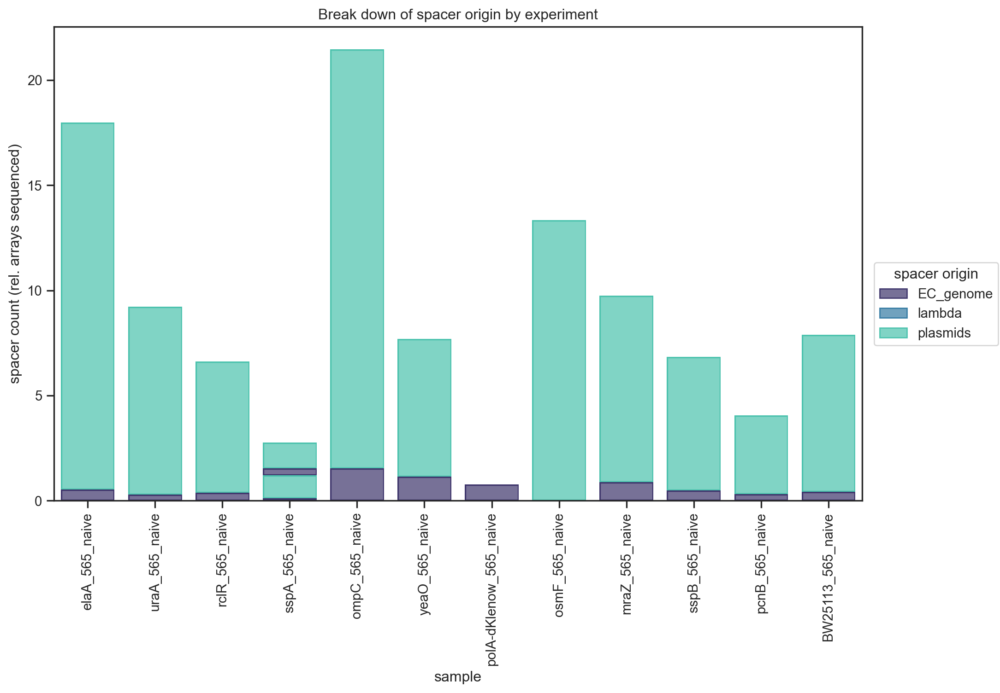

In [81]:
import seaborn.objects as so
from seaborn import axes_style

sns.set_palette('mako')

g = (
    so.Plot(try_this_plt_perarray, x="Description", y="count", color="source", )
    .add(so.Bar(), so.Stack())
    .layout(size=(10, 8), engine = 'tight')
    .theme(axes_style("ticks"))
    .scale(color="mako")
    .label(title="Break down of spacer origin by experiment", x="sample", y="spacer count (rel. arrays sequenced)", color="spacer origin")
).plot()

g._figure.axes[0].xaxis.set_tick_params(rotation=90)

g.save('spcrs_origin_stacked_bars_perarray_msDMP2_{0}.pdf'.format(set_to_plt), bbox_inches='tight')

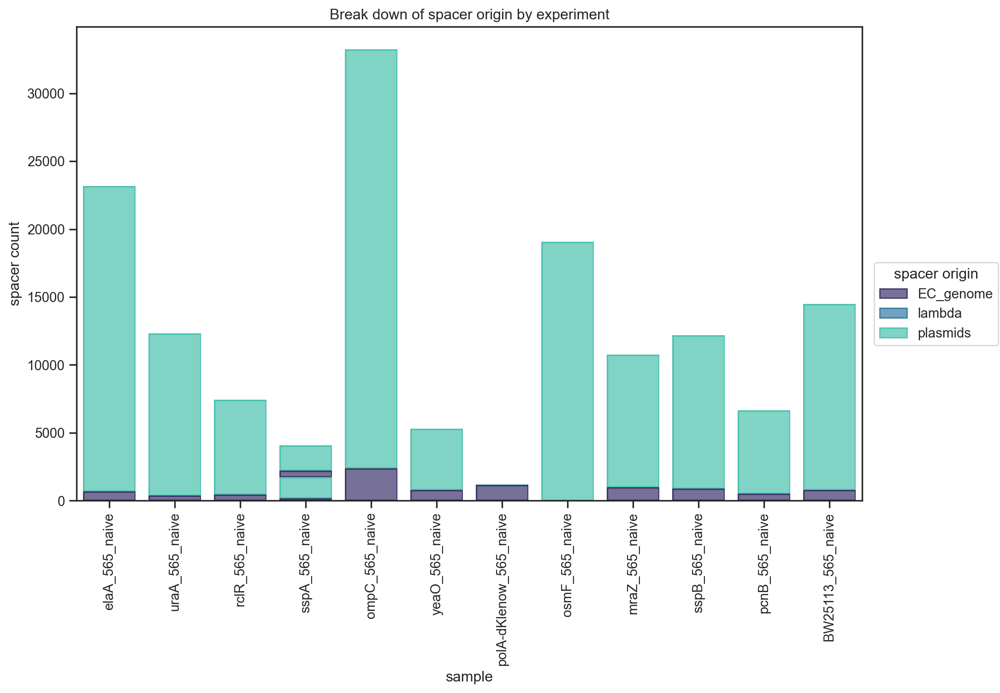

In [33]:
import seaborn.objects as so
from seaborn import axes_style

sns.set_palette('mako')

g = (
    so.Plot(try_this_plt, x="Description", y="count", color="source", )
    .add(so.Bar(), so.Stack())
    .layout(size=(10, 8), engine = 'tight')
    .theme(axes_style("ticks"))
    .scale(color="mako")
    .label(title="Break down of spacer origin by experiment", x="sample", y="spacer count", color="spacer origin")
).plot()

g._figure.axes[0].xaxis.set_tick_params(rotation=90)

g.save('spcrs_origin_stacked_bars_msDMP2_{0}.pdf'.format(set_to_plt), bbox_inches='tight')

### plot the unique new spacer count w.r.t. spacer origin and strain mutant (unique spacer count)

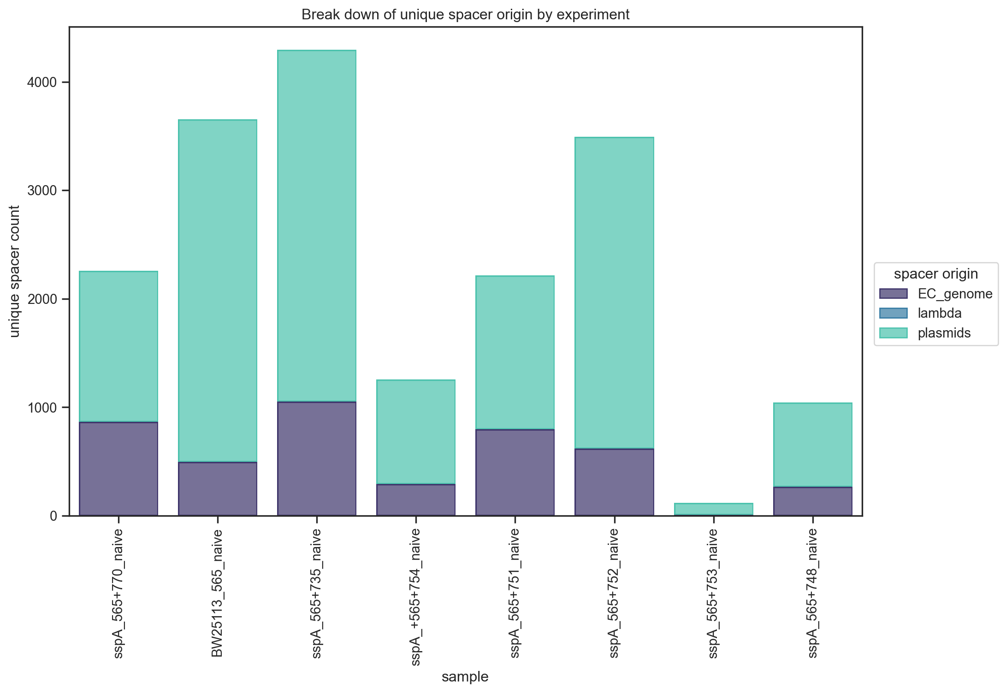

In [117]:
import seaborn.objects as so
from seaborn import axes_style

sns.set_palette('mako')

g = (
    so.Plot(unique_try_this_plt, x="Description", y="count", color="source", )
    .add(so.Bar(), so.Stack())
    .layout(size=(10, 8), engine = 'tight')
    .theme(axes_style("ticks"))
    .scale(color="mako")
    .label(title="Break down of unique spacer origin by experiment", x="sample", y="unique spacer count", color="spacer origin")
).plot()

g._figure.axes[0].xaxis.set_tick_params(rotation=90)

g.save('unique_spcrs_origin_stacked_bars_msDMP2_{0}.pdf'.format(set_to_plt), bbox_inches='tight')

### plot the percent of new spacers belonging to each spacer origin, according to strain mutant

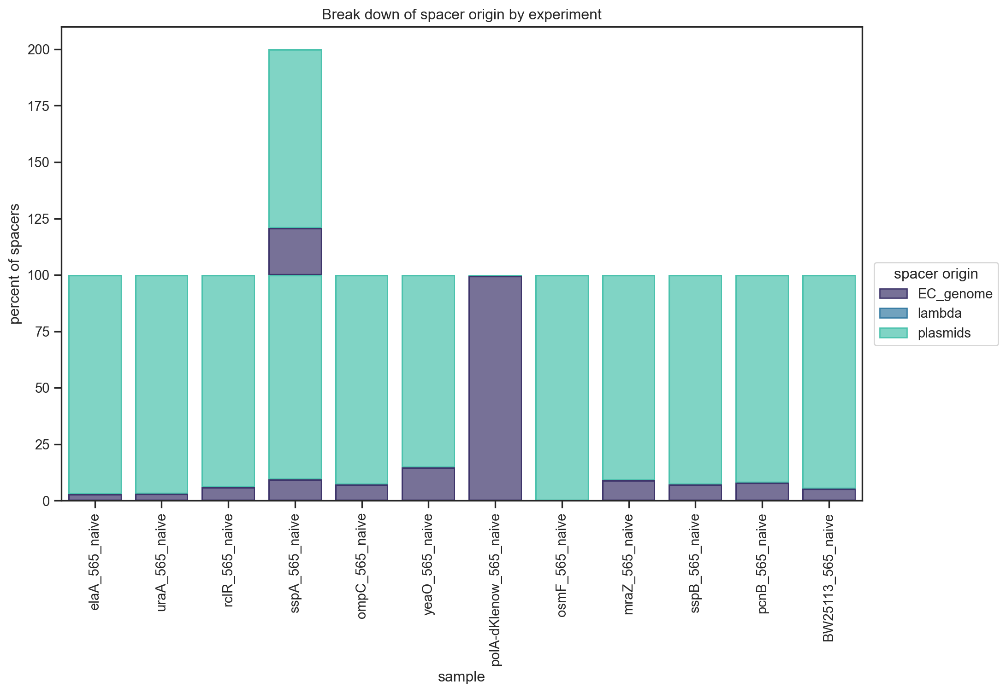

In [82]:
import seaborn.objects as so
from seaborn import axes_style

sns.set_palette('mako')

g = (
    so.Plot(try_this_plt_norm, x="Description", y="pct", color="source", )
    .add(so.Bar(), so.Stack())
    .layout(size=(10, 8), engine = 'tight')
    .theme(axes_style("ticks"))
    .scale(color="mako")
    .label(title="Break down of spacer origin by experiment", x="sample", y="percent of spacers", color="spacer origin")
).plot()

g._figure.axes[0].xaxis.set_tick_params(rotation=90)

g.save('spcrs_origin_stacked_bars_norm_msDMP2_{0}.pdf'.format(set_to_plt), bbox_inches='tight')

### same as above but looking at unique spacers this time 

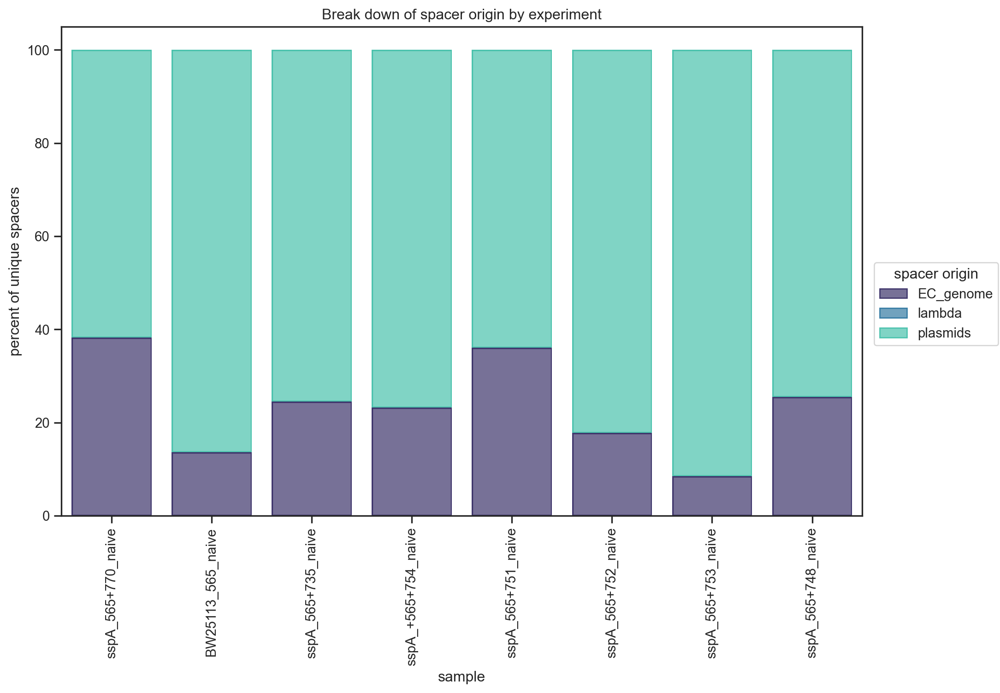

In [119]:
import seaborn.objects as so
from seaborn import axes_style

sns.set_palette('mako')

g = (
    so.Plot(unique_try_this_plt_norm, x="Description", y="pct", color="source", )
    .add(so.Bar(), so.Stack())
    .layout(size=(10, 8), engine = 'tight')
    .theme(axes_style("ticks"))
    .scale(color="mako")
    .label(title="Break down of spacer origin by experiment", x="sample", y="percent of unique spacers", color="spacer origin")
).plot()

g._figure.axes[0].xaxis.set_tick_params(rotation=90)

g.save('unique_spcrs_origin_stacked_bars_norm_msDMP2_{0}.pdf'.format(set_to_plt), bbox_inches='tight')

# Coverage plots

### fx to calculate the sliding mean occupancy

In [34]:
def sliding_mean(occupancy, ws, ss):
            
        pos_list, fc_list = [], []
    
        window_size = int(len(occupancy) / ws) # default: 10000
        step_size = int(len(occupancy) / ss) # default: 20000
        
        pos_list = list(range(0, len(occupancy), step_size)) + [len(occupancy)]
        
        for pos in pos_list:
            window_start_pos = pos - int(window_size / 2)
            window_end_pos = pos + int(window_size / 2)
            window_start_pos = 0 if window_start_pos < 0 else window_start_pos
            window_end_pos = len(occupancy) if window_end_pos > len(occupancy) else window_end_pos

            subseq = occupancy[window_start_pos:window_end_pos]
            fc = np.mean(subseq, axis = 0)
            
            fc_list.append(fc)

        return (np.array(pos_list), np.array(fc_list))

### plot spacer distribution on lambda genome 

In [36]:
set_to_plt = "A"
to_plot_ = list(samples[samples['run']==set_to_plt]['sample_name'])
print(len(to_plot_))

13


In [122]:
for sample_of_interest in to_plot_:
    try:
    # Initialize Circos instance with genome size
        circos = Circos(sectors={gbk_lambda.name: gbk_lambda.range_size})
        circos.text(f"Lambda phage\n\n{gbk_lambda.name}", size=14)
        circos.rect(r_lim=(50, 60), fc="lightgrey", ec="none", alpha=0.5)
        sector = circos.sectors[0]
        
        # ws, ss = 7500, 100000
        ws, ss = 4850.2, 4850.2
        occ = occupancy_all['{0}_new_spacers.fasta_blast_lambda.xml'.format(sample_of_interest)]
        spacer_track = sector.add_track((58, 100), r_pad_ratio=0.1)
        
        pos_list, pos_values = sliding_mean(occ, ws, ss)
        
        vmax = max(pos_values)
        vmin = min(pos_values)
        print (vmax, vmin)
        
        spacer_track.fill_between(pos_list, pos_values, vmax = vmax, vmin = 0, color = 'purple')
        
        
        # Plot forward strand CDS
        f_cds_track = sector.add_track((55, 60))
        f_cds_feats = gbk_lambda.extract_features("CDS", target_strand=1)
        f_cds_track.genomic_features(f_cds_feats, plotstyle="arrow", fc="salmon", lw=0.5)
        
        # Plot reverse strand CDS
        r_cds_track = sector.add_track((50, 55))
        r_cds_feats = gbk_lambda.extract_features("CDS", target_strand=-1)
        r_cds_track.genomic_features(r_cds_feats, plotstyle="arrow", fc="skyblue", lw=0.5)
        
        # Plot 'gene' qualifier label if exists
        pos_spcrs_on_genome = np.nonzero(np.array(occupancy_all['{0}_new_spacers.fasta_blast_lambda.xml'.format(sample_of_interest)]))
        pos_spcrs_on_genome
        
        labels, label_pos_list = [], []
        for r in gbk_lambda.records:
            for f in r.features[1:]:
                s, e = int(f.location.start), int(f.location.end)
                for pos in pos_spcrs_on_genome[0]:
                    if ((s <= pos) & (e >= pos)): 
                        if ((f.type == 'gene') or (f.type == 'CDS') or (f.type == 'misc_feature')):
                            label_pos = (s + e) / 2
                            if 'gene' in f.qualifiers:
                                if ((f.type == 'gene') and (f.qualifiers['gene'][0] not in labels)):
                                    labels.append(f.qualifiers['gene'][0])       
                                    label_pos_list.append(label_pos)
                                
                            elif 'CDS' in f.qualifiers:
                                if ((f.type == 'CDS') and (f.qualifiers['gene'][0] not in labels)):
                                    labels.append(f.qualifiers['gene'][0])
                                    label_pos_list.append(label_pos)
                            elif 'misc_feature' in f.qualifiers:
                                if ((f.type == 'misc_feature') and (f.qualifiers['note'][0] not in labels)):
                                    labels.append(f.qualifiers['note'][0])
                                    label_pos_list.append(label_pos)
                            elif 'locus_tag' in f.qualifiers:
                                if ((f.type == 'locus_tag') and (f.qualifiers['locus_tag'][0] not in labels)):
                                    labels.append(f.qualifiers['note'][0])
                                    label_pos_list.append(label_pos)
                            else:
                                print (f.qualifiers)
        naming_track = sector.add_track((50, 55))
        naming_track.xticks(label_pos_list, labels, label_size=5, label_orientation="vertical", outer = False)
        position_track = sector.add_track((55, 60))
        fig = circos.plotfig()
        
        plt.savefig("lambda_{0}_{1}_{2}.pdf".format(ws, ss,sample_of_interest), bbox_inches='tight')#, frameon = False)
    except KeyError as e:
        print (e)

'msDMP_02_109_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_110_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_111_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_112_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_113_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_114_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_115_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_116_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_117_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_118_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_119_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_123_new_spacers.fasta_blast_lambda.xml'
'msDMP_02_124_new_spacers.fasta_blast_lambda.xml'


In [37]:
set_to_plt = "A"
to_plot_ = list(samples[samples['run']==set_to_plt]['sample_name'])
print(len(to_plot_))

13


### plot spacer distribution on E. coli genome 

0.34518828451882844 0.0
1.3117154811715481 0.0
0.20711297071129708 0.0
0.20711297071129708 0.0
KeyError - reason "'msDMP_02_113_new_spacers.fasta_blast_EC.xml'"
0.24163179916317992 0.0
0.17259414225941422 0.0
17.36297071129707 0.0
0.8284518828451883 0.0
1.8242677824267783 0.0
1.6569037656903767 0.0
0.2813807531380753 0.0
0.10355648535564854 0.0


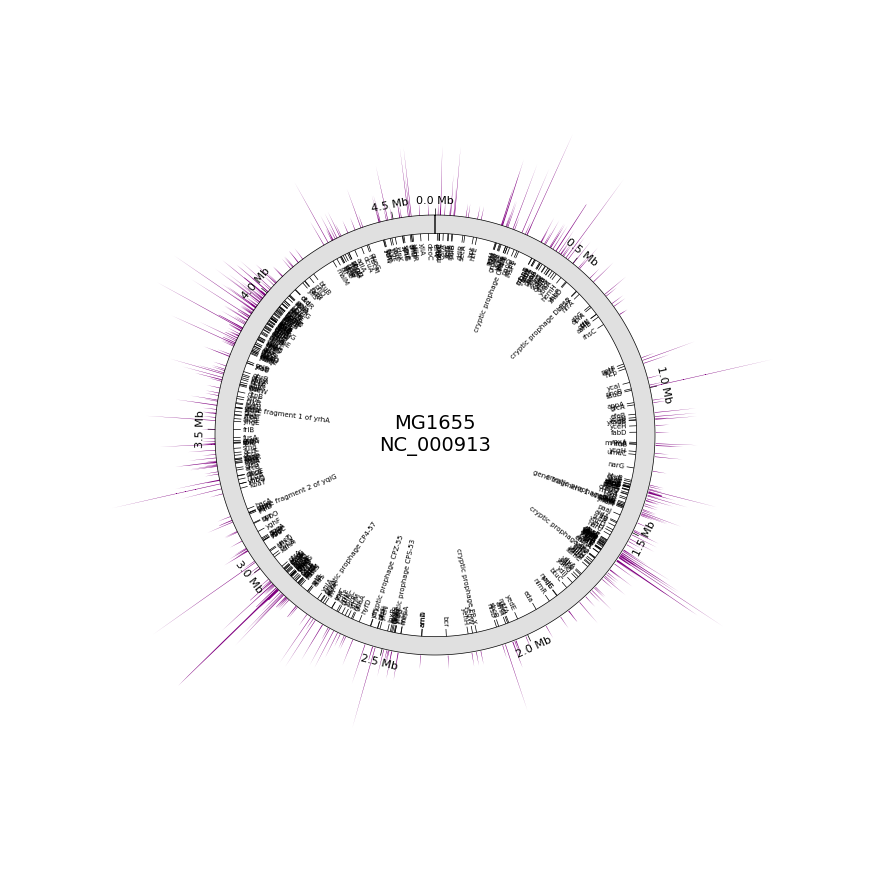

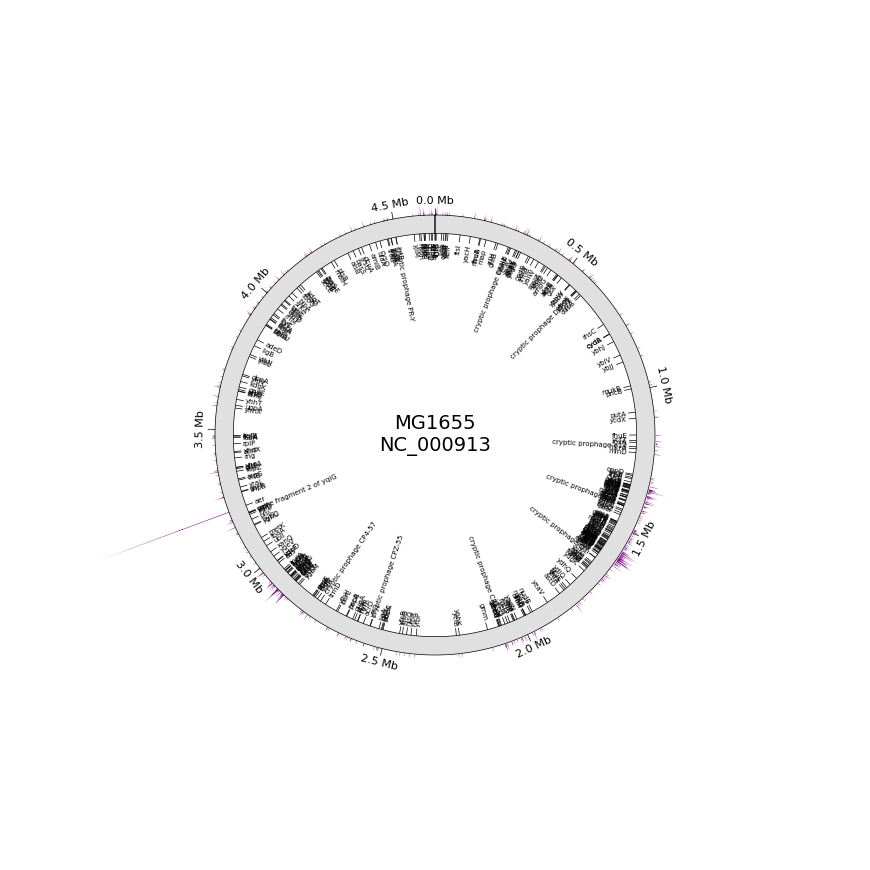

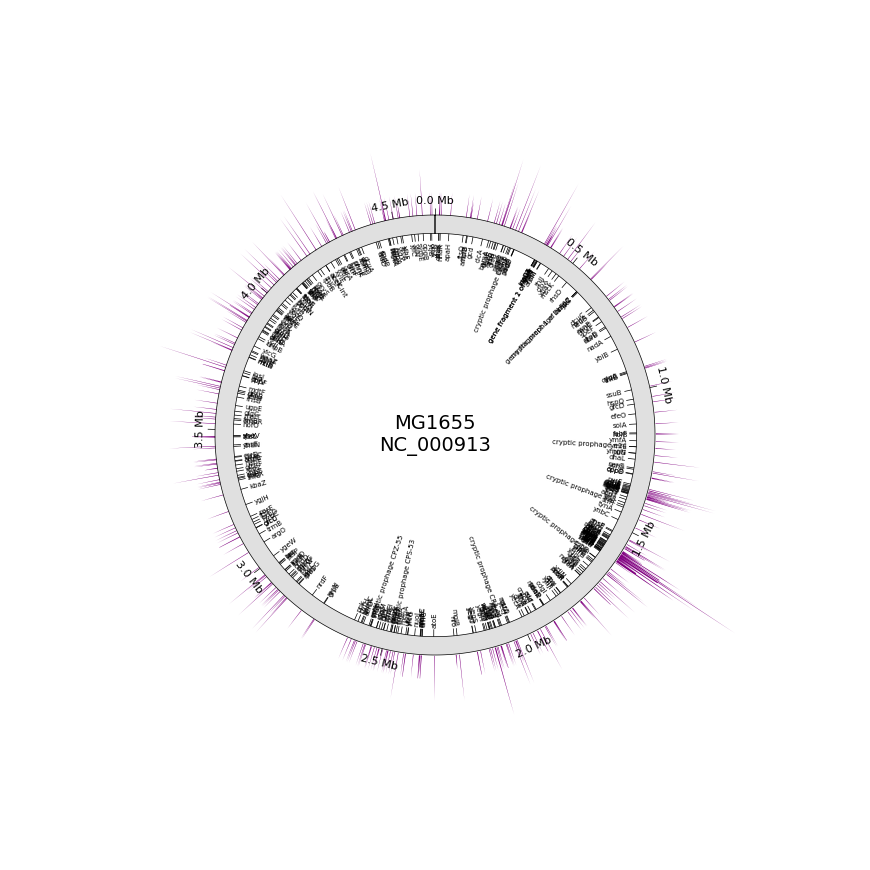

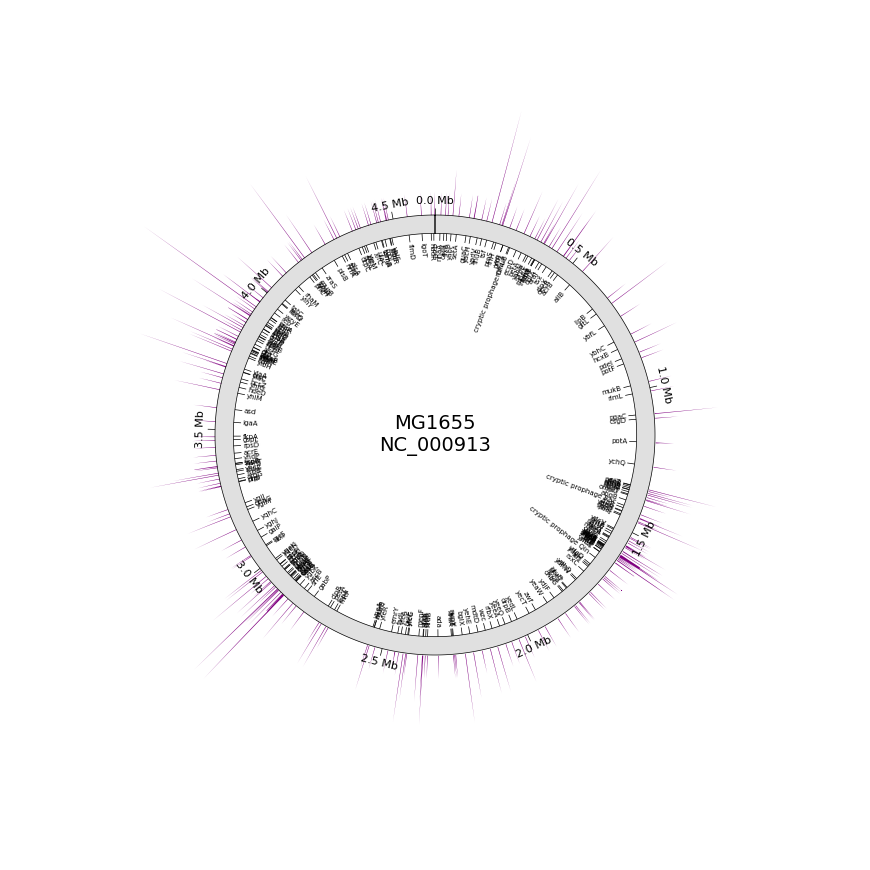

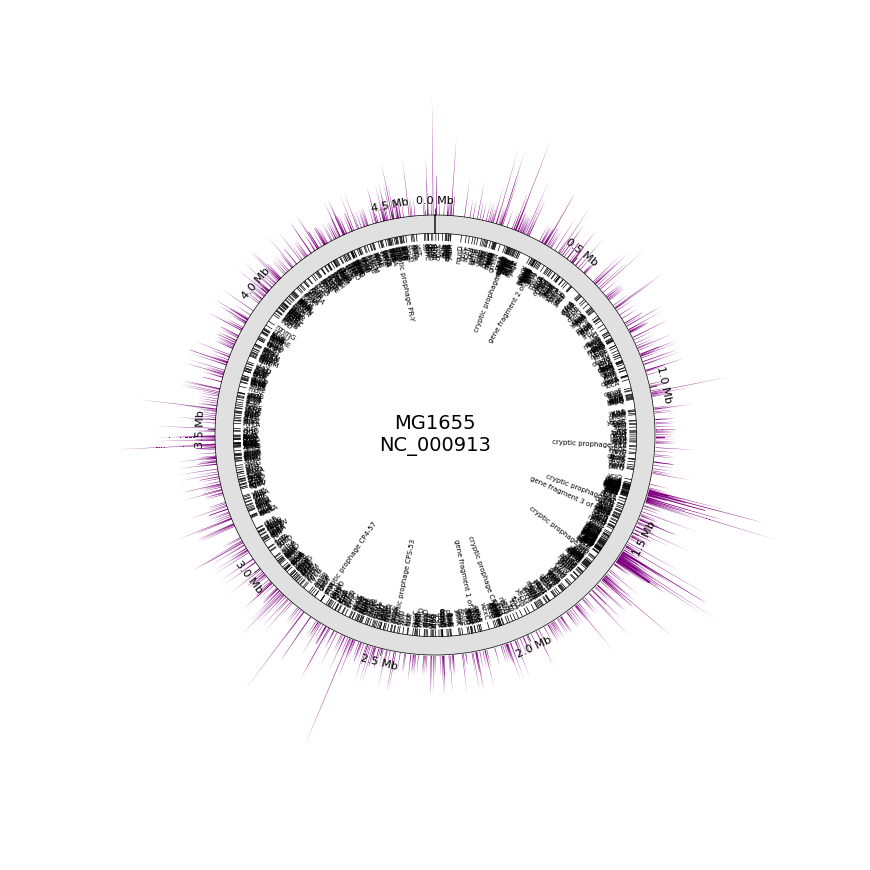

...

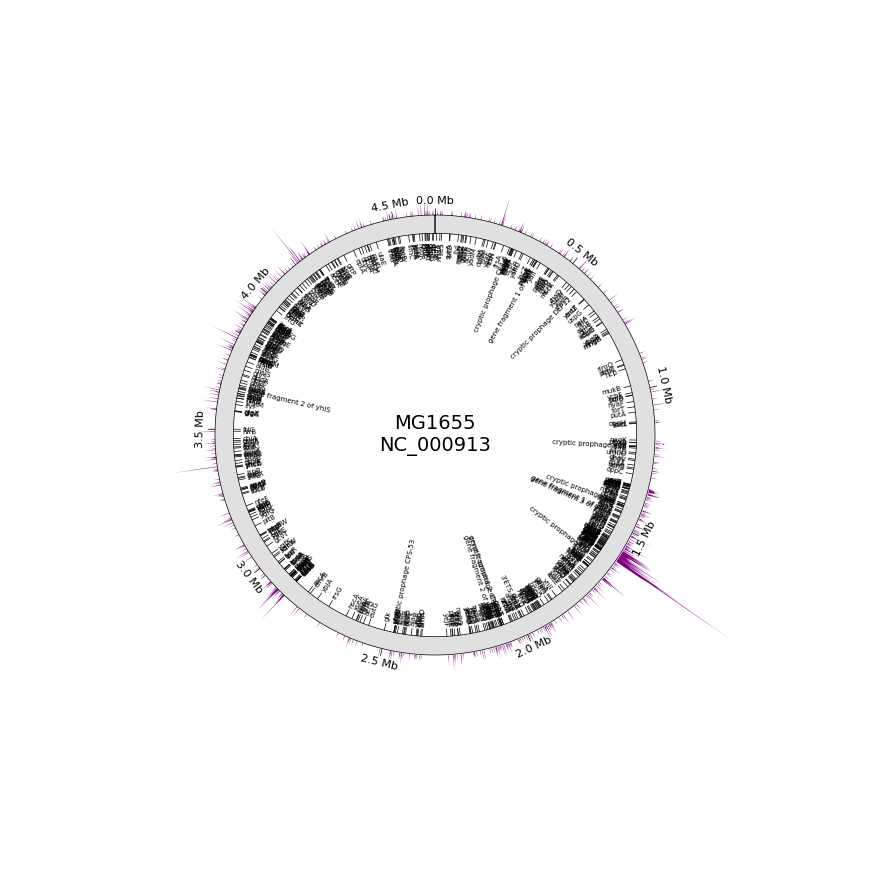

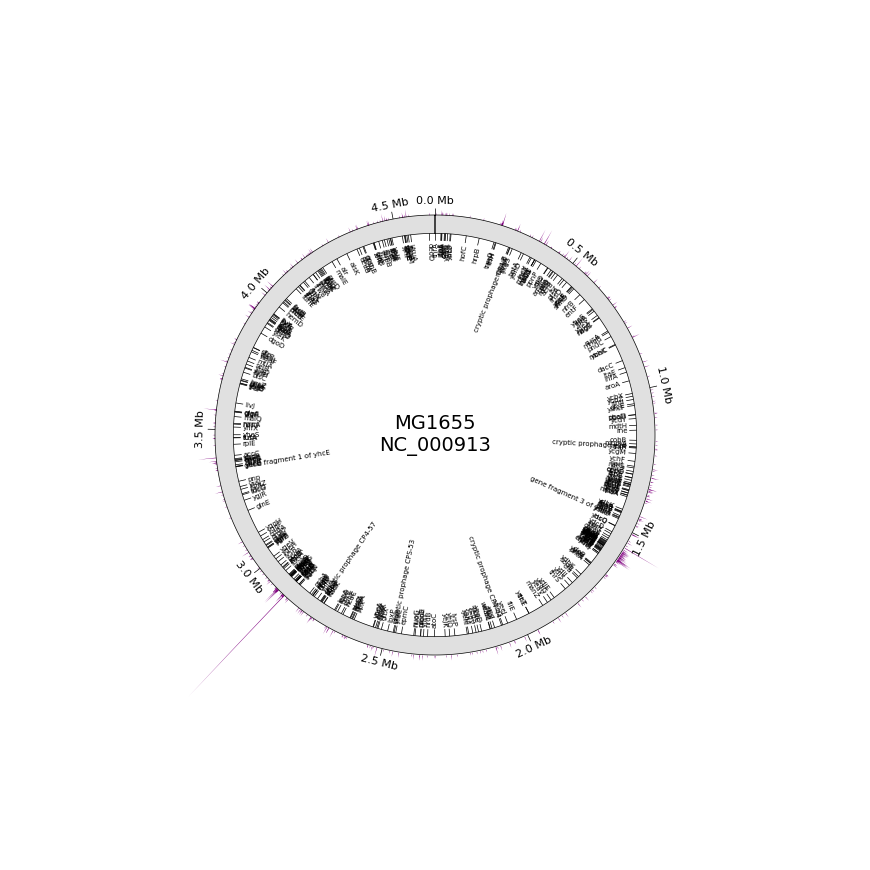

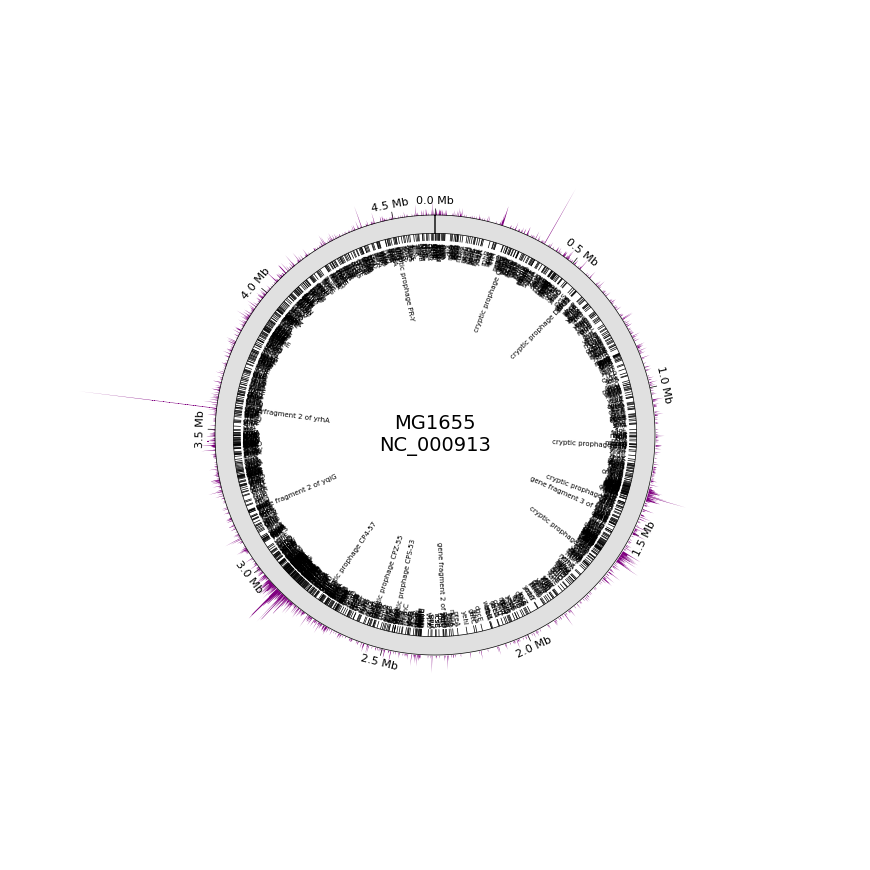

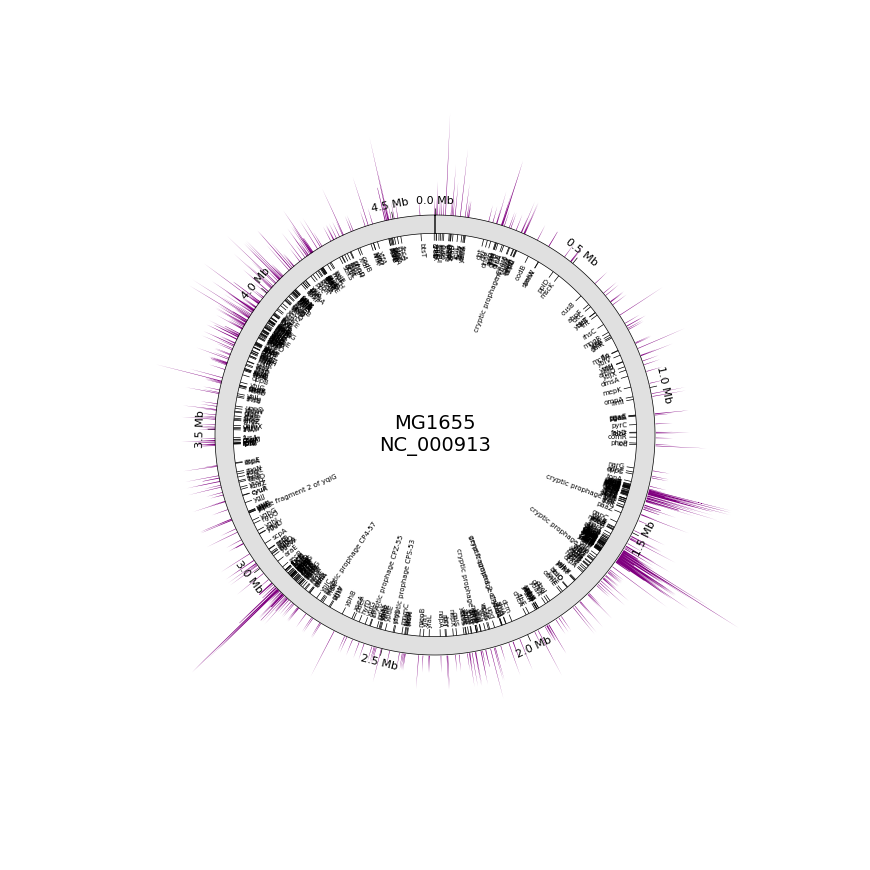

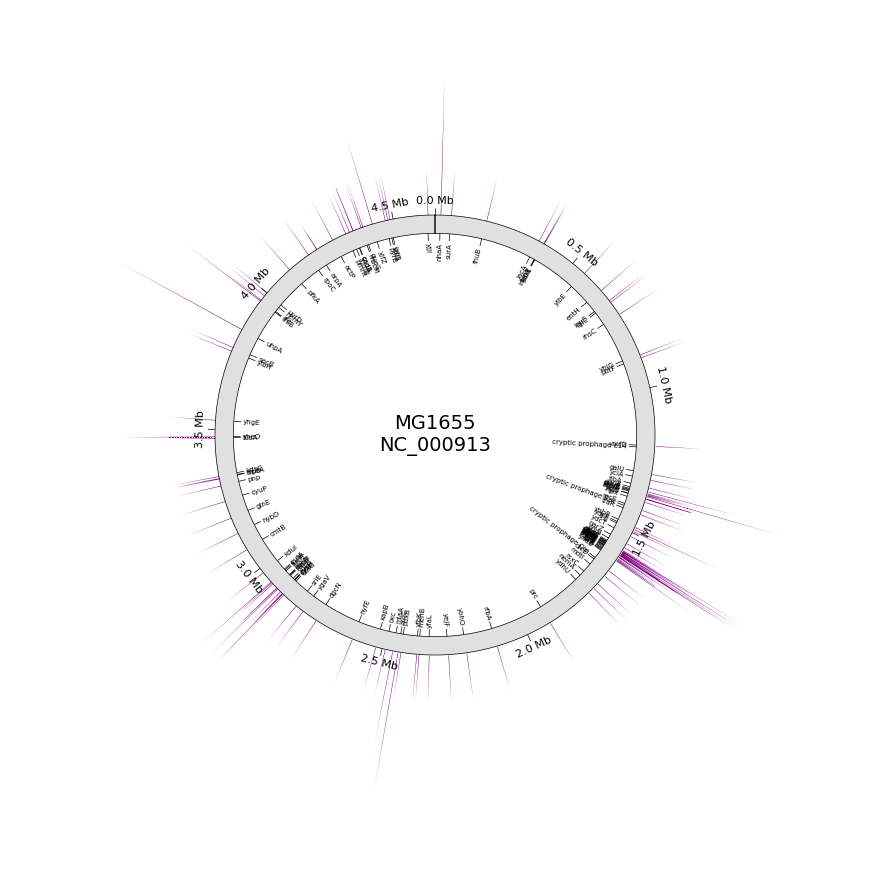

In [38]:
for sample_of_interest in to_plot_:
    try:
        
        # Initialize Circos instance with genome size
        circos = Circos(sectors={gbk_ec.name: gbk_ec.range_size})
        circos.text(f"MG1655\n{gbk_ec.name}", size=14)
        circos.rect(r_lim=(55, 60), fc="lightgrey", ec="none", alpha=0.5, )
        
        sector = circos.sectors[0]
        
        # Plot outer track with xticks
        major_ticks_interval = 500000
        minor_ticks_interval = 100000
        
        # genome size = 4641652
        # ws, ss = 4641.652, 5000 # <---- prev
        ws, ss = 4850.2, 4850.2
        occ = occupancy_all['{0}_new_spacers.fasta_blast_EC.xml'.format(sample_of_interest)]        
        spacer_track = sector.add_track((58, 100), r_pad_ratio=0.1)
        
        pos_list, pos_values = sliding_mean(occ, ws, ss)
        
        vmax = max(pos_values)
        vmin = min(pos_values)
        print (vmax, vmin)
        
        spacer_track.fill_between(pos_list, pos_values, vmax = vmax, vmin = 0, color = 'purple')
        
        pos_spcrs_on_genome = np.nonzero(np.array(occupancy_all['{0}_new_spacers.fasta_blast_EC.xml'.format(sample_of_interest)]))
        pos_spcrs_on_genome
        
        labels, label_pos_list = [], []
        for r in gbk_ec.records:
            for f in r.features[1:]:
                s, e = int(f.location.start), int(f.location.end)
                for pos in pos_spcrs_on_genome[0]:
                    if ((s <= pos) & (e >= pos)): 
                        if ((f.type == 'gene') or (f.type == 'CDS') or (f.type == 'misc_feature')):
                            label_pos = (s + e) / 2
                            if ((f.type == 'gene') and (f.qualifiers['gene'][0] not in labels)):
                                labels.append(f.qualifiers['gene'][0])       
                                label_pos_list.append(label_pos)
                            elif ((f.type == 'CDS') and (f.qualifiers['gene'][0] not in labels)):
                                labels.append(f.qualifiers['gene'][0])
                                label_pos_list.append(label_pos)
                            elif ((f.type == 'misc_feature') and (f.qualifiers['note'][0] not in labels)):
                                labels.append(f.qualifiers['note'][0])
                                label_pos_list.append(label_pos)
        
        # tracks to add gene labels
        naming_track = sector.add_track((55, 60))
        naming_track.xticks(label_pos_list, labels, label_size=5, label_orientation="vertical", outer = False)
        
        # Plot xticks (interval = 10 Kb)
        position_track = sector.add_track((55, 60))
        position_track.axis(fc="#EEEEEE", ec="black", lw=0.5)
        
        position_track.xticks_by_interval(
            major_ticks_interval, label_formatter=lambda v: f"{v/10 **6:.1f} Mb")        
        fig = circos.plotfig()
                
        plt.savefig("EC_WT_{0}_{1}_{2}.pdf".format(ws, ss, sample_of_interest), bbox_inches='tight')#, frameon = False)
    except KeyError as e:
        print ('KeyError - reason "%s"' % str(e))

### same but simpler view, looking at spacers on genome (if genome were linear)

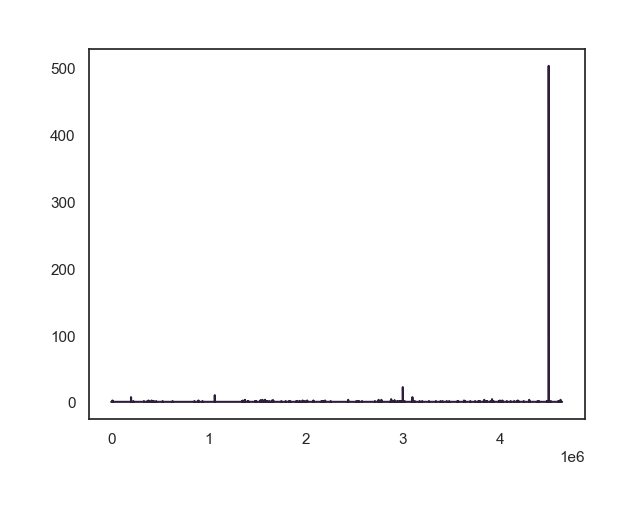

In [99]:
pos_list = np.linspace(1, len(occ), len(occ))
plt.plot(pos_list , occ)

In [130]:
set_to_plt = "B"
to_plot_ = list(samples[samples['run']==set_to_plt]['sample_name'])
print(len(to_plot_))

8


### plot spacer distribution on pSCL565 (CRISPR-Cas1+2 expressing plasmid)

497.0 5.0
2128.0 1.0
70.0 0.0
1837.0 4.0
687.0 5.0
1.0 0.0
531.0 4.0
309.0 3.0
430.0 2.0
2149.0 2.0
7002.0 8.0
424.0 7.0
48.0 3.0


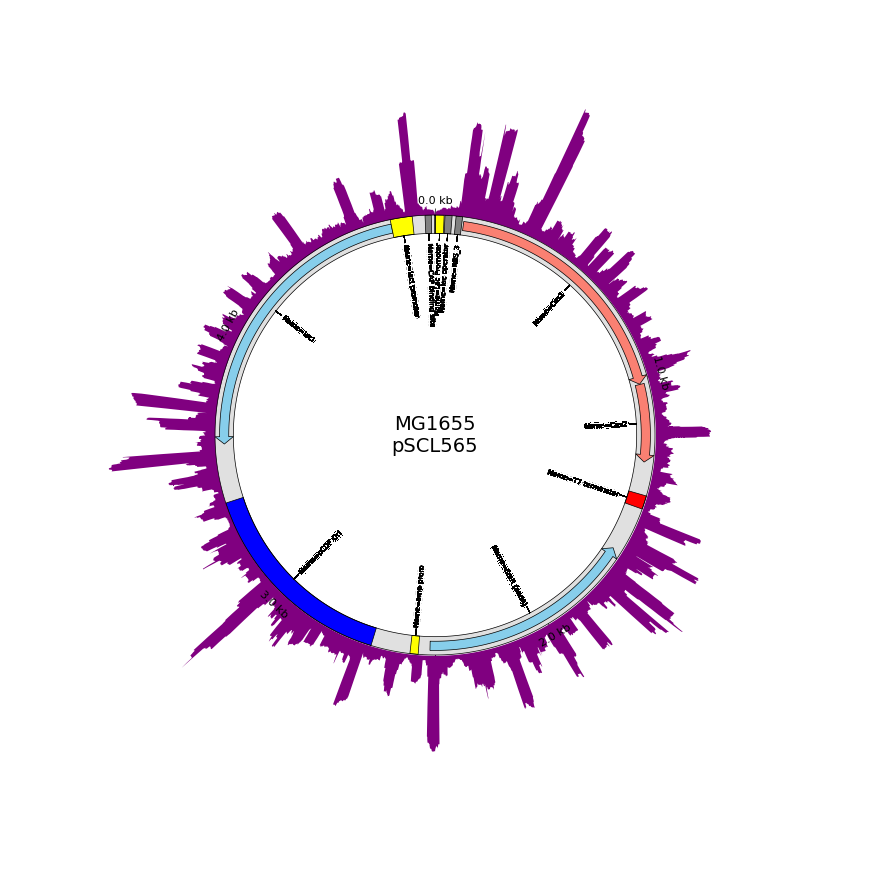

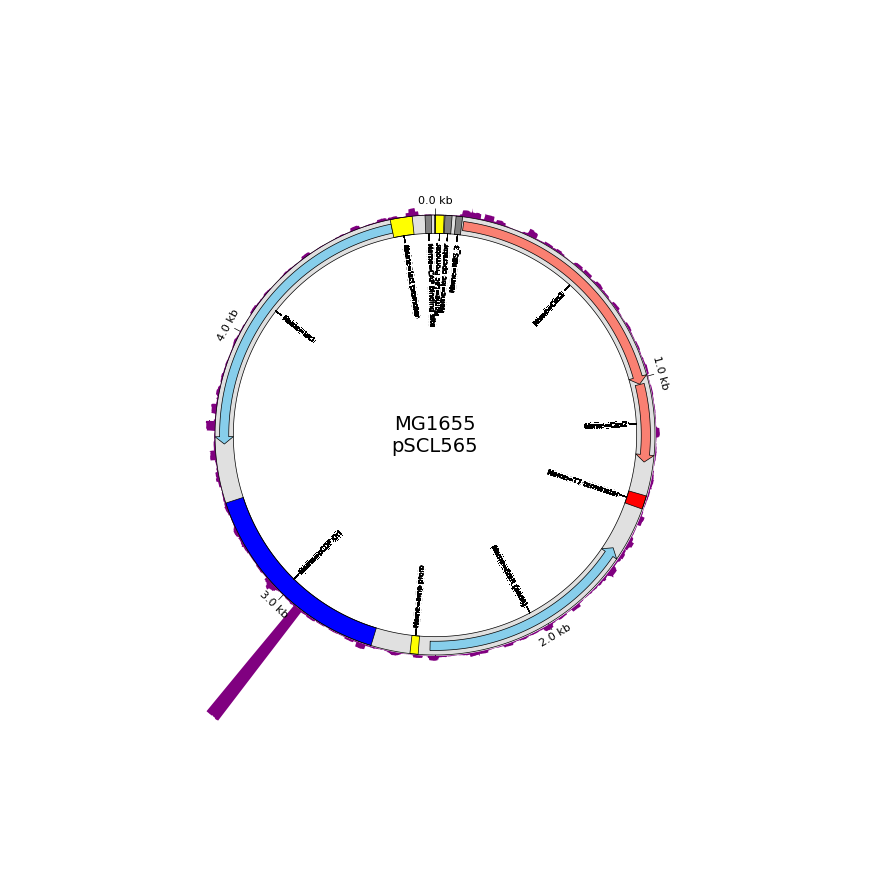

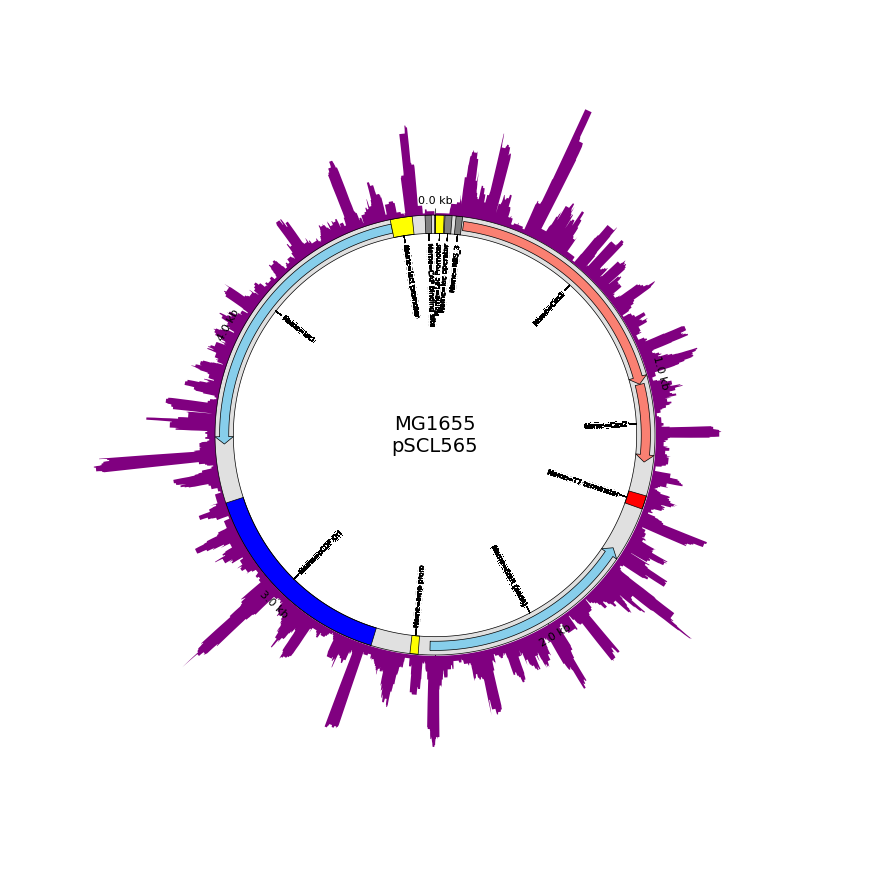

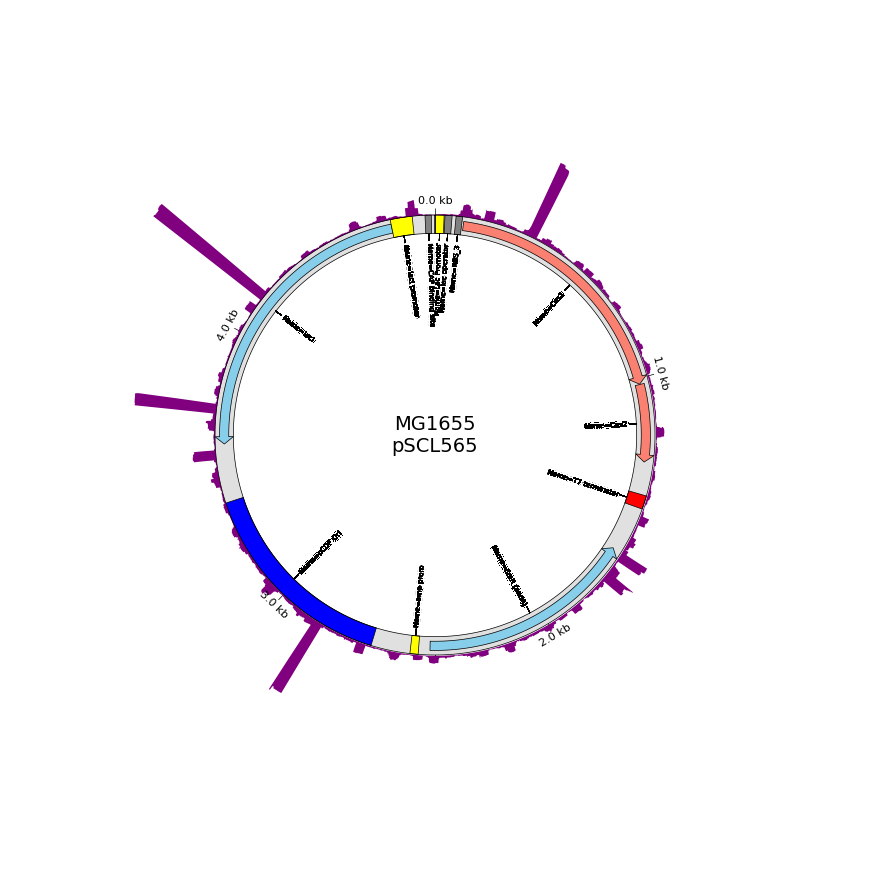

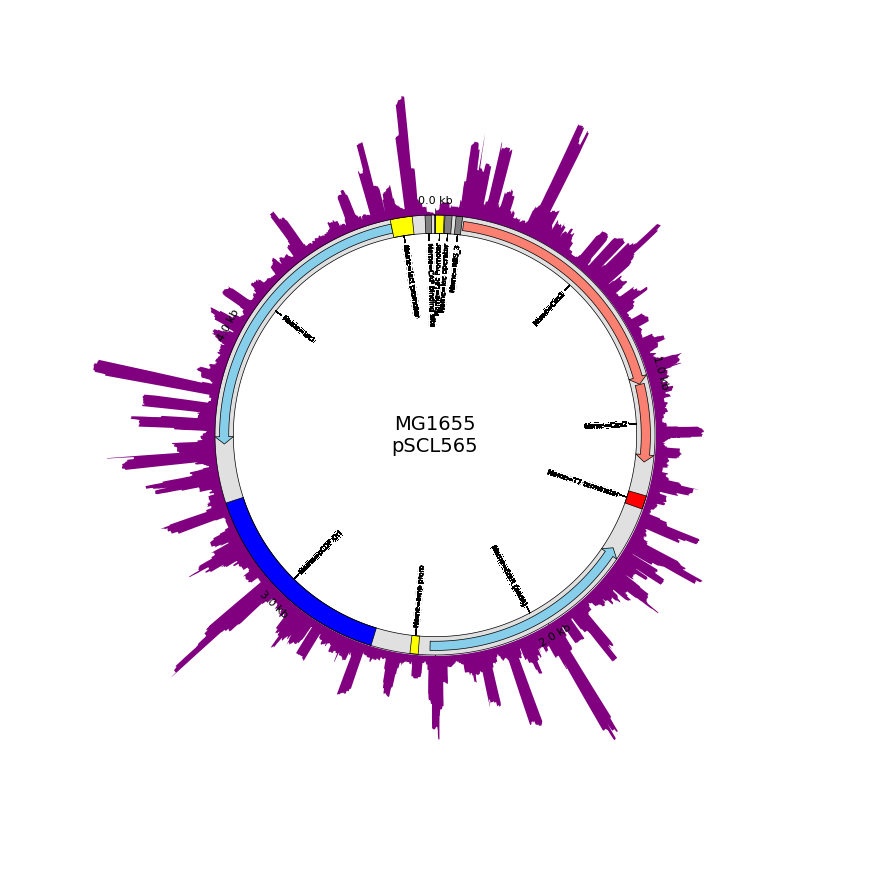

...

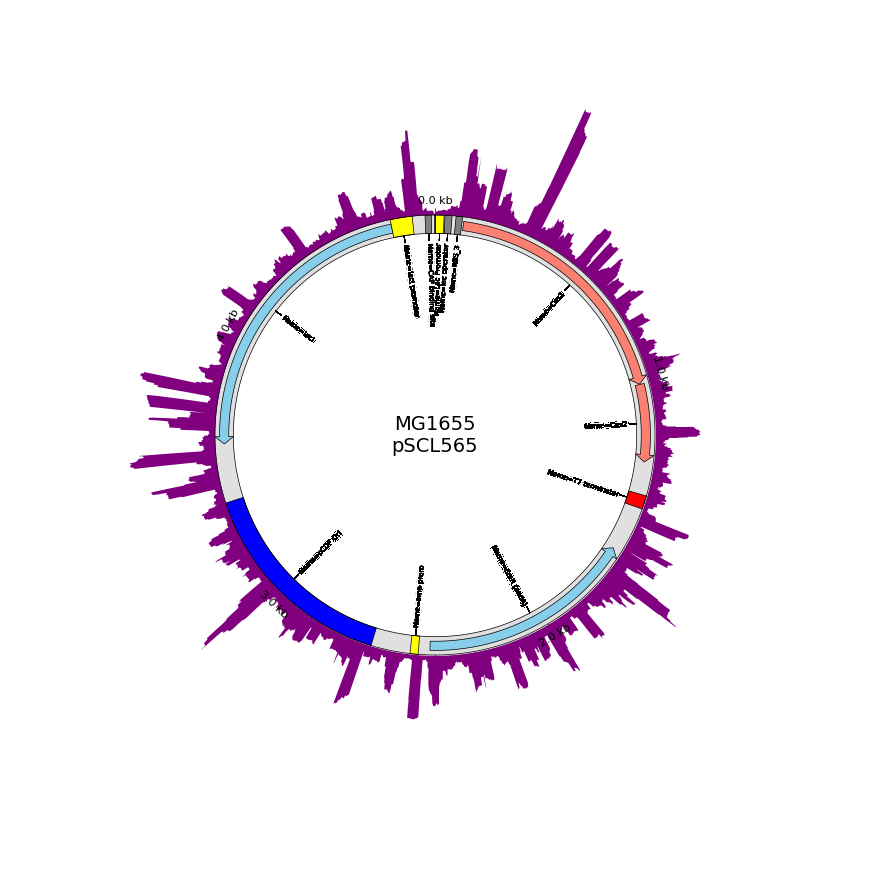

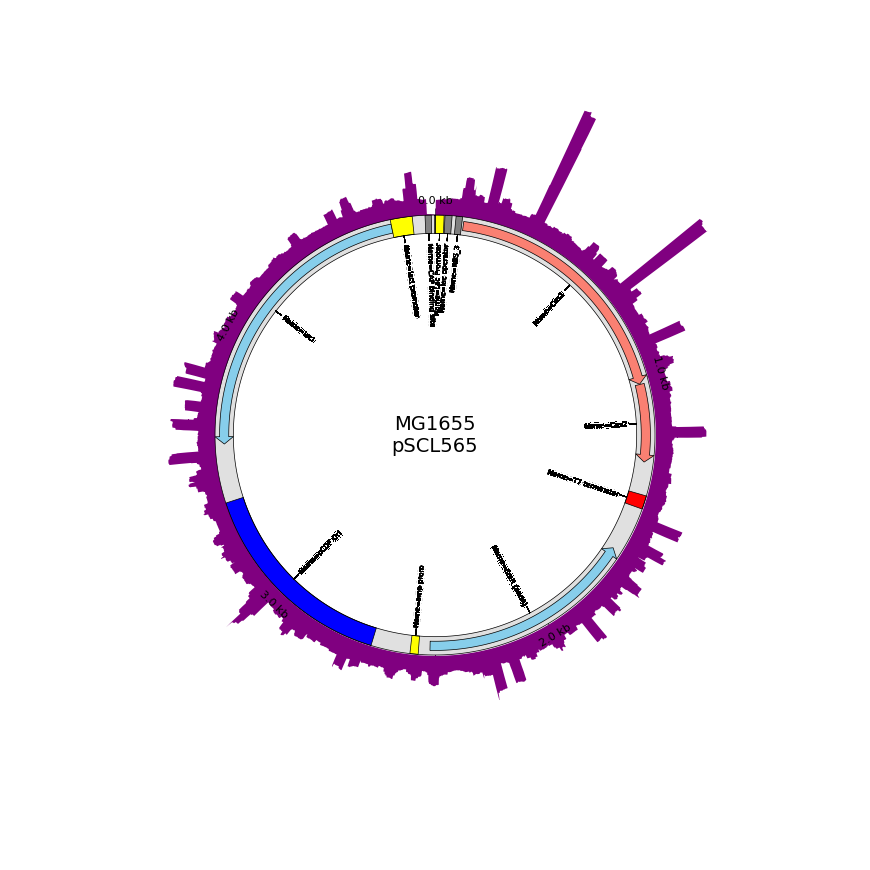

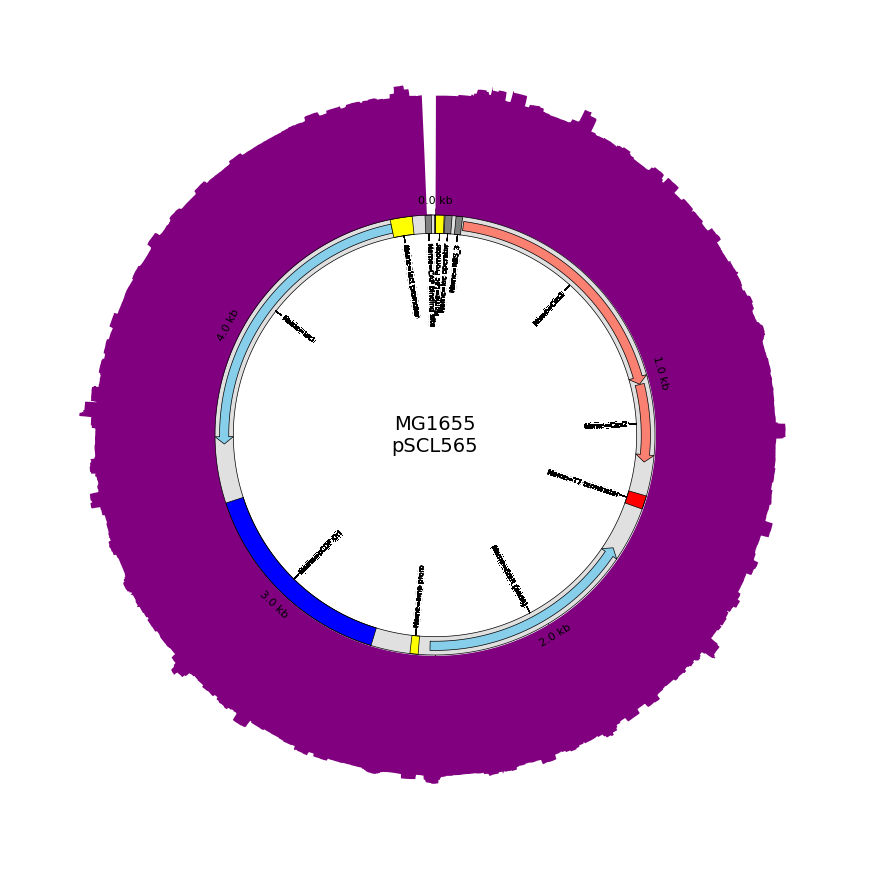

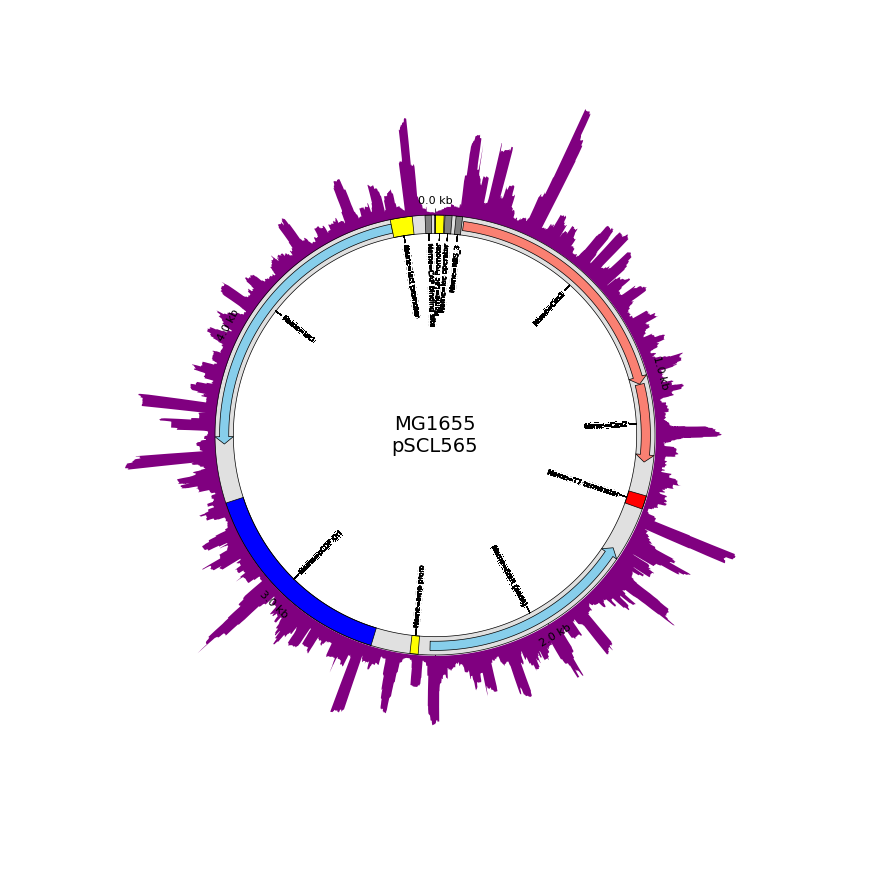

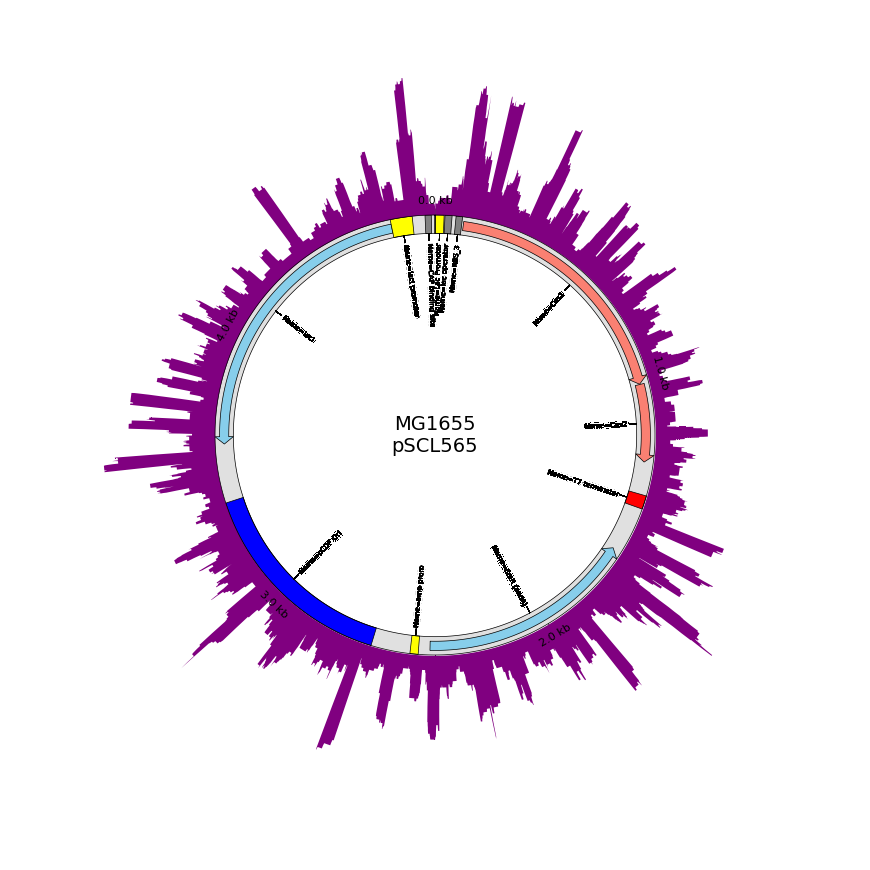

In [39]:
from pycirclize.parser import Gff
gff = Gff('pSCL565_.gff')
gbk = pscl565_df_gtf
for sample_of_interest in to_plot_:
    try:
        # Initialize Circos instance with genome size
        circos = Circos(sectors={'pSCL565': 4832})
        circos.text(f"MG1655\n{'pSCL565'}", size=14)
        circos.rect(r_lim=(55, 60), fc="lightgrey", ec="none", alpha=0.5, )
        
        sector = circos.sectors[0]
        # Plot outer track with xticks
        major_ticks_interval = 1000
        minor_ticks_interval = 500
        
        ws, ss = 4832, 4832
        
        occ = occupancy_all['{0}_new_spacers.fasta_blast_565.xml'.format(sample_of_interest)]
        pos_list = np.linspace(1, len(occ), len(occ))
        spacer_track = sector.add_track((58, 100), r_pad_ratio=0.1)
        pos_list, pos_values = pos_list, occ
        vmax = max(pos_values)
        vmin = min(pos_values)
        print (vmax, vmin)
        
        spacer_track.fill_between(pos_list, pos_values, vmax = vmax, vmin = 0, color = 'purple')
        
        trax = sector.add_track((55, 60))
        f_cds_feats = gff.extract_features('CDS', target_strand=1)
        r_cds_feats = gff.extract_features("CDS", target_strand=-1)
        promoter_feats = gff.extract_features("promoter", target_strand=1)
        promoter_feats_r = gff.extract_features("promoter", target_strand=-1)
        pbind_feats = gff.extract_features("protein_bind", target_strand=1)
        pbind_feats_r = gff.extract_features("protein_bind", target_strand=-1)        
        misc_feature_feats = gff.extract_features("misc_feature_", target_strand=1)
        misc_feature_feats_r = gff.extract_features("misc_feature_", target_strand=-1)        
        terminator_feats = gff.extract_features("terminator", target_strand=0)   
        rep_origin_feats = gff.extract_features("rep_origin", target_strand=1)
        rep_origin_feats_r = gff.extract_features("rep_origin", target_strand=-1)
        
        trax.genomic_features(f_cds_feats, plotstyle="arrow", fc="salmon", lw=0.5)
        trax.genomic_features(r_cds_feats, plotstyle="arrow", fc="skyblue", lw=0.5)
        trax.genomic_features(promoter_feats, plotstyle="box", fc="yellow", lw=0.5)
        trax.genomic_features(promoter_feats_r, plotstyle="box", fc="yellow", lw=0.5)
        trax.genomic_features(pbind_feats, plotstyle="box", fc="grey", lw=0.5)
        trax.genomic_features(pbind_feats_r, plotstyle="box", fc="grey", lw=0.5)
        trax.genomic_features(misc_feature_feats, plotstyle="box", fc="grey", lw=0.5)
        trax.genomic_features(misc_feature_feats_r, plotstyle="box", fc="grey", lw=0.5)
        trax.genomic_features(terminator_feats, plotstyle="box", fc="red", lw=0.5)
        trax.genomic_features(rep_origin_feats, plotstyle="box", fc="blue", lw=0.5)
        trax.genomic_features(rep_origin_feats_r, plotstyle="box", fc="blue", lw=0.5)
    
        pos_spcrs_on_genome = np.nonzero(np.array(occupancy_all['{0}_new_spacers.fasta_blast_565.xml'.format(sample_of_interest)]))

        labels, label_pos_list = [], []
        for f in gbk[1:]['attributes']:
            s,e = int(gbk[gbk['attributes']==f]['start']), int(gbk[gbk['attributes']==f]['end']) 
            for pos in pos_spcrs_on_genome[0]:
                if ((s <= pos) & (e >= pos)): 
                    label_pos = (s + e) / 2
                    labels.append(f)       
                    label_pos_list.append(label_pos)
                    
        # tracks to add gene labels
        naming_track = sector.add_track((55, 60))
        naming_track.xticks(label_pos_list, labels, label_size=5, label_orientation="vertical", outer = False)

        # Plot xticks (interval = 10 Kb)
        position_track = sector.add_track((55, 60))
        position_track.axis(fc="#EEEEEE", ec="black", lw=0.5)
        
        position_track.xticks_by_interval(
            major_ticks_interval, label_formatter=lambda v: f"{v/1000:.1f} kb")
        
        fig = circos.plotfig()
        
        plt.savefig("565_{0}_{1}_{2}.pdf".format(ws, ss, sample_of_interest), bbox_inches='tight')#, frameon = False)
    except KeyError as e:
            print ('KeyError - reason "%s"' % str(e))

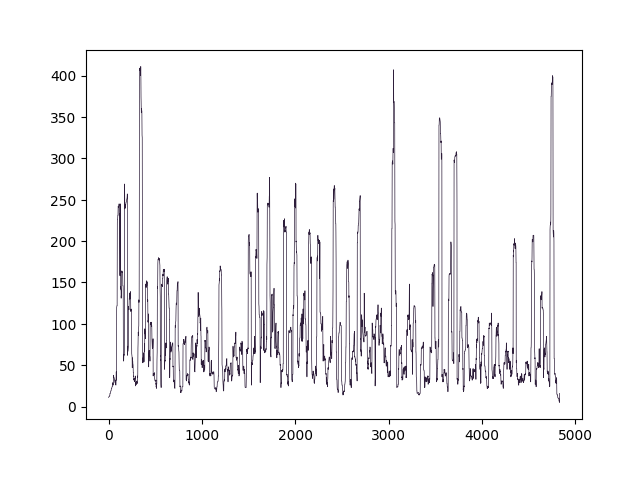

In [241]:
pos_list = np.linspace(1, len(occ), len(occ))
plt.pyplot.plot(pos_list , occ)

_______________